* Analysis based on the used curated sample, not complete publication history
* The findings reflect patterns within the collected dataset, and not necessarily representative of all TDS content.

## Data Specs
* Dataset link (Kaggle) - https://www.kaggle.com/datasets/annpastushko/towards-data-science-articles-dataset-20102021
* Data from 2010 - 2021
* We are focusing on data from 2017 - 2021 because the number of articles before 2017 per year is as low as 5.
* There is imbalance in the number of articles collected for each year (even from 2017-2021). Being honest about this limitation because we don't know if the person who collected the data might have just missed to collect some of the articles or if in reality, only that many articles were published for that year. 

#### Features:
1. Publication date
2. Title
3. Author
4. Article URL
5. Number of claps
6. Number of responses
7. Amount of time spent on reading based on the average reading speed of an adult (roughly 265 WPM).
8. Paid or free (Participation in Medium Partner Program)

## Importing the data

In [1]:
import pandas as pd
df = pd.read_csv('tds_data.csv')

In [2]:
df.head()

,publish_date,title,author,url,claps,responses,reading_time,paid
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1


##### Checking the 'Article Counts per Year'

In [3]:
# check the actual distribution
year_counts = df['publish_date'].str[:4].value_counts().sort_index()
print("Articles per year:")
print(year_counts)

# Also check the total count
print(f"Total articles: {len(df)}")
print(f"Date range: {df['publish_date'].min()} to {df['publish_date'].max()}")

Articles per year:
publish_date
2010        1
2011        1
2013        1
2014        2
2015       32
2016       47
2017     2418
2018     4785
2019    10650
2020    19665
2021     8477
Name: count, dtype: int64
Total articles: 46079
Date range: 2010-11-21 to 2021-07-31


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46079 entries, 0 to 46078
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   publish_date  46079 non-null  object
 1   title         46079 non-null  object
 2   author        46079 non-null  object
 3   url           46079 non-null  object
 4   claps         46079 non-null  int64 
 5   responses     46079 non-null  int64 
 6   reading_time  46079 non-null  int64 
 7   paid          46079 non-null  int64 
dtypes: int64(4), object(4)
memory usage: 2.8+ MB


Converting the `publish_date` column to datetime format

In [5]:
df['publish_date'] = pd.to_datetime(df['publish_date'])

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46079 entries, 0 to 46078
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   publish_date  46079 non-null  datetime64[ns]
 1   title         46079 non-null  object        
 2   author        46079 non-null  object        
 3   url           46079 non-null  object        
 4   claps         46079 non-null  int64         
 5   responses     46079 non-null  int64         
 6   reading_time  46079 non-null  int64         
 7   paid          46079 non-null  int64         
dtypes: datetime64[ns](1), int64(4), object(3)
memory usage: 2.8+ MB


In [7]:
df.shape

(46079, 8)

#### 1. Creating a 2017-2021 subset of the data
Since that is the timeframe that we're focusing on because of the dataset limitations (fewer articles per year below 2017 (.i.e., 2010-2016 ))

In [8]:
# df in the focused timeframe
df_filtered = df[df['publish_date'].dt.year.isin([2017, 2018, 2019, 2020, 2021])]
df_filtered.shape

(45995, 8)

In [9]:
print("Original dataset: {} articles".format(len(df)))
print("2017 - 2021 dataset (subset of df): {} articles".format(len(df_filtered)))
print("Percentage of articles retained: {}%".format(round(len(df_filtered)/len(df)*100, 1)))

Original dataset: 46079 articles
2017 - 2021 dataset (subset of df): 45995 articles
Percentage of articles retained: 99.8%


* Thus, our new df, 'df_filtered', has only 84 articles (records) lesser than in the original df, 'df'.

Checking the article distribution by year in `df_filtered`

In [10]:
year_dist = df_filtered['publish_date'].dt.year.value_counts().sort_index()
print("Article Distribution in the filtered dataframe: \n")
print(year_dist)

Article Distribution in the filtered dataframe: 

publish_date
2017     2418
2018     4785
2019    10650
2020    19665
2021     8477
Name: count, dtype: int64


#### 2. Data Exploration and Data Cleaning

##### Important Dataset (`df_filtered`) info
* Shape - (45995, 8)

In [11]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45995 entries, 0 to 45994
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   publish_date  45995 non-null  datetime64[ns]
 1   title         45995 non-null  object        
 2   author        45995 non-null  object        
 3   url           45995 non-null  object        
 4   claps         45995 non-null  int64         
 5   responses     45995 non-null  int64         
 6   reading_time  45995 non-null  int64         
 7   paid          45995 non-null  int64         
dtypes: datetime64[ns](1), int64(4), object(3)
memory usage: 3.2+ MB


In [12]:
import numpy as np

In [13]:
# Only for the numeric columns
df_filtered.describe(include = [np.number])

,claps,responses,reading_time,paid
count,45995.00000,45995.000000,45995.000000,45995.000000
mean,266.43957,1.706968,7.177019,0.646875
std,862.46199,5.158535,3.810192,0.477946
min,0.00000,0.000000,0.000000,0.000000
25%,29.00000,0.000000,5.000000,0.000000
50%,87.00000,0.000000,6.000000,1.000000
75%,224.00000,2.000000,9.000000,1.000000
max,52000.00000,298.000000,67.000000,1.000000


In [14]:
# Include the datetime column as well 
df_filtered.describe() # or df_filtered.describe(include = [np.datetime64])

,publish_date,claps,responses,reading_time,paid
count,45995,45995.00000,45995.000000,45995.000000,45995.000000
mean,2020-01-28 18:26:36.225676544,266.43957,1.706968,7.177019,0.646875
min,2017-01-02 00:00:00,0.00000,0.000000,0.000000,0.000000
25%,2019-06-25 00:00:00,29.00000,0.000000,5.000000,0.000000
50%,2020-04-29 00:00:00,87.00000,0.000000,6.000000,1.000000
75%,2020-11-03 00:00:00,224.00000,2.000000,9.000000,1.000000
max,2021-07-31 00:00:00,52000.00000,298.000000,67.000000,1.000000
std,NaN,862.46199,5.158535,3.810192,0.477946


##### Action points :
1. Wow - An article got 52,000 claps. Need to check if this is an outlier and validate it by investigating the article.
2. How is minimum reading time 0? - Amount of time spent on reading based on the average reading speed (roughly 265 WPM). So 0 Words Per Minute - Assuming that is invalid: will investigate it further. 
3. How can we check if the values given under the feature `reading_time` is in minutes or not? <br>
##### Observations:
1. The articles are collected from `2nd Jan 2017` to `31st July 2021`
2. About 64.7% articles are paid - So most of the authors have participation in Medium's Partner Program.
3. Based on the percentile information provided for `responses`, we can see that a lot of the articles (at least 50%) have very few responses.

#### Filtering the df to exclude articles with reading time = 0

In [15]:
# how many would be removed
print(f"Articles with 0 reading time: {(df_filtered['reading_time'] == 0).sum()}")

# New df with reading time >= 1
df_clean = df_filtered[df_filtered['reading_time'] > 0].copy()

Articles with 0 reading time: 1


In [16]:
df_clean.describe()

,publish_date,claps,responses,reading_time,paid
count,45994,45994.000000,45994.000000,45994.000000,45994.000000
mean,2020-01-28 18:17:31.024046592,266.438862,1.707005,7.177175,0.646889
min,2017-01-02 00:00:00,0.000000,0.000000,1.000000,0.000000
25%,2019-06-25 00:00:00,29.000000,0.000000,5.000000,0.000000
50%,2020-04-29 00:00:00,87.000000,0.000000,6.000000,1.000000
75%,2020-11-03 00:00:00,224.000000,2.000000,9.000000,1.000000
max,2021-07-31 00:00:00,52000.000000,298.000000,67.000000,1.000000
std,NaN,862.471353,5.158585,3.810086,0.477942


* New minimum reading time = 1

In [17]:
# Look at articles with 1 minute reading time
one_min_articles = df_clean[df_clean['reading_time'] == 1]
print(f"Number of 1-minute articles: {len(one_min_articles)}")
print(f"Percentage: {len(one_min_articles)/len(df_clean)*100:.2f}%")

# Look at some examples
print("\nSample 1-minute articles:")
print(one_min_articles[['title', 'reading_time', 'claps', 'url']].head(10))

# Check their engagement patterns
print("\nEngagement stats for 1-minute articles:")
print(one_min_articles[['claps', 'responses']].describe())

Number of 1-minute articles: 171
Percentage: 0.37%

Sample 1-minute articles:
                                                  title  reading_time  claps  \
2119               Get Started With Bayesian Statistics             1    143   
2669  What is Likelihood-Free Inference, and What Ar...             1     75   
3152  Want a Challenging but Rewarding Read? Explore...             1     34   
3465  What Kind of Knowledge Does Data Science Produce?             1     35   
3905    Interested in Decision Intelligence? Start Here             1    102   
4166          Common Distance Measures Simply Explained             1    139   
4780  Curious about Variational Autoencoders (VAEs)?...             1     29   
5665  How do you remain on top of Machine Learning r...             1    112   
5804                                     Exciting news!             1     86   
5847  Latest picks: 8 Common Pitfalls of Running A/B...             1      8   

                                         

* https://towardsdatascience.com/get-started-with-bayesian-statistics-5c657bb588/
* The above article is an example of articles that are having a reading time of 1 minute.

In [18]:
# Validating the article with the reading time of 67 minutes
df_clean[df_clean['reading_time'] == 67]

,publish_date,title,author,url,claps,responses,reading_time,paid
17410,2020-07-20,An Introduction to Deep Feedforward Neural Net...,Reza Bagheri,https://towardsdatascience.com/an-introduction...,16,0,67,1
29226,2019-12-01,"Understanding Gaussian Process, the Socratic Way",Wei Yi,https://towardsdatascience.com/understanding-g...,454,7,67,1


* The second article above's url: https://medium.com/data-science/understanding-gaussian-process-the-socratic-way-ba02369d804 has now changed, and hence its reading time has been changed to 69 instead of 67

Checking a sample of urls to see which ones have changed

* The above url is giving 404. The article (same author and same reading time (in 8 mins)) is now under the url "https://medium.com/data-science/why-so-many-data-scientists-are-leaving-their-jobs-a1f0329d7ea4" and it does have 52k claps (now its 53k)
* Thus, TDS might have made some url structure changes, which has led to some of the other urls (not all) in this dataset to lead to 404 page errors.

In [19]:
# Checking how many URLs are broken
import requests
def check_url_status(url):
    try:
        response = requests.get(url, timeout=5)
        return response.status_code
    except:
        return None
    
# Testing on a sample
sample_urls = df_filtered['url'].head(10).tolist()
for url in sample_urls:
    status = check_url_status(url)
    print(f"{status}: {url}")

403: https://towardsdatascience.com/titanic-feature-engineering-modeling-in-python-6749e6e87bf4
403: https://towardsdatascience.com/getting-tensorflow-developer-certified-3975d1a26050
403: https://towardsdatascience.com/data-scientists-guide-to-efficient-coding-in-python-670c78a7bf79
403: https://towardsdatascience.com/a-better-way-for-data-preprocessing-pandas-pipe-a08336a012bc
403: https://towardsdatascience.com/10-best-practices-to-write-readable-and-maintainable-sql-code-427f6bb98208
403: https://towardsdatascience.com/pandas-hacks-that-i-wish-i-had-when-i-started-out-1f942caa9792
403: https://towardsdatascience.com/solve-sudoku-using-linear-programming-python-pulp-b41b29f479f3
403: https://towardsdatascience.com/how-to-solve-a-production-planning-and-inventory-problem-in-python-45c546f4bcf0
403: https://towardsdatascience.com/these-mistakes-could-easily-ruin-your-data-science-interviews-49ce03c36bef
403: https://towardsdatascience.com/a-look-inside-the-bayesian-keyboard-c10c53e6d5

#### Explorining the articles with 52k claps (highest)

In [20]:
# Action Point 1: Outlier in 'claps' or not
display(df_clean[df_clean['claps']==52000])

,publish_date,title,author,url,claps,responses,reading_time,paid
42801,2018-03-28,Why so many data scientists are leaving their ...,Jonny Brooks-Bartlett,https://towardsdatascience.com/why-so-many-dat...,52000,298,8,0


In [21]:
df_filtered[df_filtered['claps']==52000]['url'].tolist()

['https://towardsdatascience.com/why-so-many-data-scientists-are-leaving-their-jobs-a1f0329d7ea4']

#### Solution to the 52k claps
* Since it is a valid data point (and an interesting one), we are not removing it. Also, it is possible to create another feature, where we apply log transformation to the claps data, so that their range is compressed and outlier influence is reduced.

In [22]:
df_clean.columns

Index(['publish_date', 'title', 'author', 'url', 'claps', 'responses',
       'reading_time', 'paid'],
      dtype='object')

In [23]:
df_clean['log_claps'] = np.log1p(df_clean['claps'])

In [24]:
df_clean.describe()

,publish_date,claps,responses,reading_time,paid,log_claps
count,45994,45994.000000,45994.000000,45994.000000,45994.000000,45994.000000
mean,2020-01-28 18:17:31.024046592,266.438862,1.707005,7.177175,0.646889,4.396310
min,2017-01-02 00:00:00,0.000000,0.000000,1.000000,0.000000,0.000000
25%,2019-06-25 00:00:00,29.000000,0.000000,5.000000,0.000000,3.401197
50%,2020-04-29 00:00:00,87.000000,0.000000,6.000000,1.000000,4.477337
75%,2020-11-03 00:00:00,224.000000,2.000000,9.000000,1.000000,5.416100
max,2021-07-31 00:00:00,52000.000000,298.000000,67.000000,1.000000,10.859018
std,NaN,862.471353,5.158585,3.810086,0.477942,1.556199


In [25]:
# Check the distribution
print("Original claps distribution:")
print(df_clean['claps'].describe())
print("\nLog-transformed claps distribution:")
print(df_clean['log_claps'].describe())

Original claps distribution:
count    45994.000000
mean       266.438862
std        862.471353
min          0.000000
25%         29.000000
50%         87.000000
75%        224.000000
max      52000.000000
Name: claps, dtype: float64

Log-transformed claps distribution:
count    45994.000000
mean         4.396310
std          1.556199
min          0.000000
25%          3.401197
50%          4.477337
75%          5.416100
max         10.859018
Name: log_claps, dtype: float64


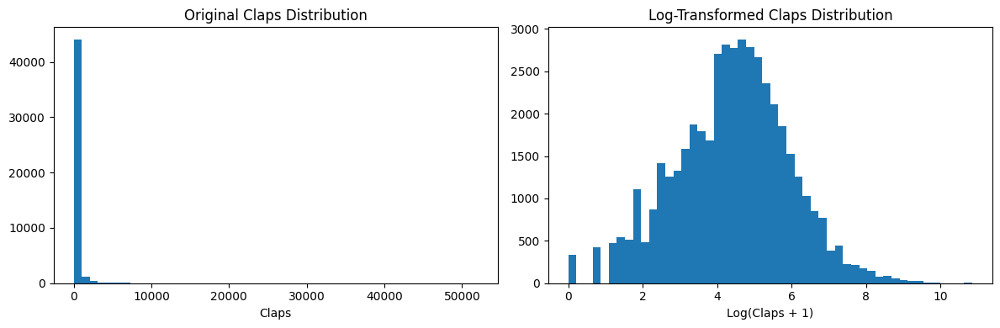

In [26]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(df_clean['claps'], bins=50)
axes[0].set_title('Original Claps Distribution')
axes[0].set_xlabel('Claps')

axes[1].hist(df_clean['log_claps'], bins=50)
axes[1].set_title('Log-Transformed Claps Distribution')
axes[1].set_xlabel('Log(Claps + 1)')

plt.tight_layout()
plt.show()

* Thus we got a normal (ish) distribution after performing the log transformation, meanwhile the original distribution was skewed (more articles clustered near zero)
* We could still use the original one for engagement metrics analysis

#### Word Cloud on the 'title' field
* To understand the common and prevalent topics overall from 2017-2021

Before creating the world clouds, we need to do a quick cleaning of the text data in the `title` field.

In [27]:
import re # regular expressions
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def clean_title(text):
    # Convert to string and lowercase (standardizing)
    text = str(text).lower()
    # Remove special characters like '\xa0'
    text = text.replace('\xa0', ' ')
    # Remove any char that is NOT a lowercase letter or a whitespace (denoted by \s).(OK if we remove the numbers - ya for now, simplicity)
    text = re.sub(r'[^a-z\s]',' ', text) 
    # Remove extra whitespace
    text = ' '.join(text.split())
    return text

df_clean['title_cleaned']= df_clean['title'].apply(clean_title)
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910,data scientist s guide to efficient coding in ...
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...


In [28]:
# Defining the stopwords
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/aiswaryasuresh/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [29]:
stop_words = set(stopwords.words('english'))
print(len(stop_words))
print(list(stop_words)[5:10])

198
['at', 'they', "that'll", 'who', 'o']


Adding a few of the common words that are seen in Data Science related articles

In [30]:
stop_words.add("introduction")

In [31]:
print(len(stop_words))

199


In [32]:
typical_article_words = ['beginner','intermediate','concepts','advanced','method','understanding','part', 'data', 'science',
                         'way','using','know','work','approach','guide','code','problem','based',
                         'example','better','explained','get', 'function','build','dataset','use',
                          'tutorial','simple','minute','step','V','getting','started','first','line',
                          'scientist','scientists','new','need','make','build','create','project','end','custom',
                          'tip','start', 'like', 'beginners', 'tool', 'world','basic', 'predicting', 'top',
                          'day', 'right', 'thing', 'every', 'steps', 'best', 'basics', 'minutes', 'big', 
                          'ways', 'question', 'review', 'creating', 'free', 'improve', 'implementation', 'making',
                          'projects', 'functions']
stop_words.update(typical_article_words)

In [33]:
len(stop_words)

271

Combining the cleaned titles

In [34]:
all_titles_cleaned = ' '.join(df_clean['title_cleaned'])

In [36]:
len(all_titles_cleaned)

2311915

* There are words in the `all_titles_cleaned` of length 1 - like 's'. But we're ignoring that for now, since they're not dominant enough to be seen in the word clouds.
* Or an easy but viable fix would be to add such words, i.e., words that could be split into two as a reason of removing special chars like apostophes. 

In [38]:
# Check if the column exists and has data
print("Columns in df_clean:", df_clean.columns.tolist())
print("\nFirst 5 cleaned titles:")
print(df_clean['title_cleaned'].head())
print(f"\nNumber of non-null values: {df_clean['title_cleaned'].notna().sum()}")
print(f"Number of empty strings: {(df_clean['title_cleaned'] == '').sum()}")

# Check one specific title
print("\nOriginal title example:")
print(df_clean['title'].iloc[0])
print("\nCleaned title example:")
print(df_clean['title_cleaned'].iloc[0])

Columns in df_clean: ['publish_date', 'title', 'author', 'url', 'claps', 'responses', 'reading_time', 'paid', 'log_claps', 'title_cleaned']

First 5 cleaned titles:
0               feature engineering modeling in python
1               getting tensorflow developer certified
2    data scientist s guide to efficient coding in ...
3      a better way for data preprocessing pandas pipe
4    best practices to write readable and maintaina...
Name: title_cleaned, dtype: object

Number of non-null values: 45994
Number of empty strings: 2

Original title example:
Feature Engineering & Modeling in Python

Cleaned title example:
feature engineering modeling in python


In [39]:
word_cloud = WordCloud(width = 1600, height = 800,
                       background_color='white', colormap='viridis',
                       stopwords=stop_words, max_words = 100, 
                       relative_scaling=0.5, min_font_size=10).generate(all_titles_cleaned)

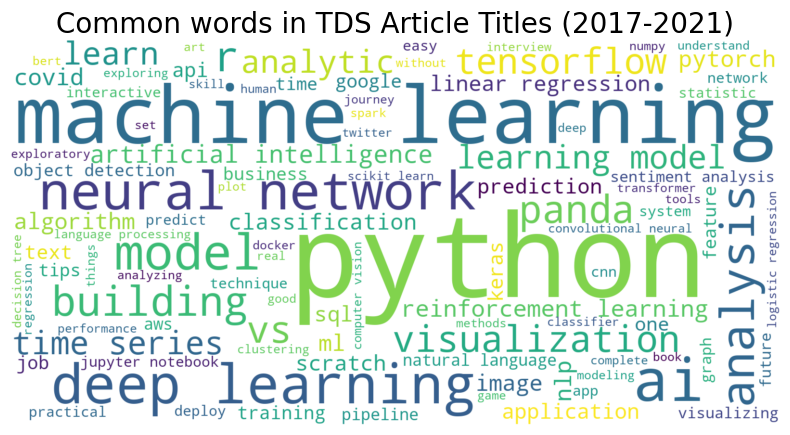

In [40]:
plt.figure(figsize=(8,8))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common words in TDS Article Titles (2017-2021)', fontsize = 20)
plt.tight_layout()
plt.show()

* Machine Learning, Deep Learning, Neural Network, tensorflow, AI, nlp, comupter vision, cnns, reinforcement learning, linear regression, tools like: umpy, keras, aws, bert, docker, scikit leran, pytorch etc are seen clearly along with Python
* LLMs are not as evdient in this data collected from 2017-2021, which makes sense since they exploded around 2022-2023 with Chatgpt's release. 
* We will try scraping data from 2022-2025 to see the pre-LLMs and post-LLMs era.

---

## 1. Engagement Prediction

* Using `Sequential` model
* Predicting `claps` instead of `responses` because as we saw during EDA, responses are very uncommon and more articles have clap data. 
* Extracting the `year`, `month` and `day` from the `publish_date` column - because there's a chance that they will reveal better patterns, i.e., Year: certain years can have better engagement than others (Data Science field might have been really popular during one time), Month: Seasonal patterns could be there, eg: More engagement in January, or during Sept-Oct (Students placement season), Day of the week: Weekday vs Weekend reading patters.

In [40]:
df_clean['year'] = df_clean['publish_date'].dt.year
df_clean['month'] = df_clean['publish_date'].dt.month
df_clean['day'] = df_clean['publish_date'].dt.dayofweek
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,year,month,day
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,2021,7,5
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,2021,7,5
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910,data scientist s guide to efficient coding in ...,2021,7,5
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,2021,7,5
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,2021,7,5


In [41]:
# Importing libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow import keras
from keras.layers import Dense, Dropout
from keras.models import Sequential

In [42]:
features = ['reading_time','year','month','day','paid']
X = df_clean[features]
y = df_clean['log_claps']

* We are using the scaled data, because even for DL models, we need to scale the data: the year ranges only from 2017-2021, reading time from 1-67 and there is a chance for the model to think that one feature (reading time) is more important because the numbers are bigger
* The Gradients could be unstable when the feature are of different scales, because some weights might update too fast and some too slow. 
* We usually don't scale when we are working with images (pixels 0-255 or normalized to 0-1), text embeddings (in similar ranges), and binary features (0/1 only). So we need scaling when we have tabular/structured data with mized feature ranges. 

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=42)

In [44]:
# Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [45]:
print(df_clean['log_claps'].min(), df_clean['log_claps'].max())

0.0 10.859018228147887


In [46]:
model = Sequential()
model.add(Dense(64, activation = 'relu', input_shape = (X_train_scaled.shape[1],)))
model.add(Dropout(0.3))
model.add(Dense(32, activation = 'relu'))
model.add(Dropout(0.3))
model.add(Dense(16, activation = 'relu'))
model.add(Dense(1)) # since log_claps are >= 0 here
model.summary()

/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2025-10-17 17:52:22.244586: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4
2025-10-17 17:52:22.244648: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-10-17 17:52:22.244659: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2025-10-17 17:52:22.244689: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-10-17 17:52:22.244707: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.c

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,009 (11.75 KB)

 Trainable params: 3,009 (11.75 KB)

 Non-trainable params: 0 (0.00 B)

In [48]:
from keras.optimizers import Adam
model.compile(optimizer='adam', loss = 'mse', metrics = ['mae'])

In [49]:
history = model.fit(X_train_scaled, y_train, validation_split=0.2,
                    epochs = 50, batch_size=32, verbose = 1)

Epoch 1/50


2025-10-16 22:40:49.683036: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


920/920 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 6.4646 - mae: 1.9853 - val_loss: 3.7612 - val_mae: 1.5566
Epoch 2/50
920/920 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 4.9669 - mae: 1.7007 - val_loss: 2.3163 - val_mae: 1.2056
Epoch 3/50
920/920 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 4.6153 - mae: 1.6369 - val_loss: 2.6245 - val_mae: 1.2882
Epoch 4/50
920/920 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 4.7839 - mae: 1.6594 - val_loss: 2.8191 - val_mae: 1.3351
Epoch 5/50
920/920 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 4.5073 - mae: 1.6104 - val_loss: 4.8123 - val_mae: 1.7942
Epoch 6/50
920/920 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 4.2495 - mae: 1.5928 - val_loss: 2.3412 - val_mae: 1.2118
Epoch 7/50
920/920 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 4.7866 - mae: 1.6702 - val_loss: 5.5617 - val_mae: 1.9414
Epoch 8/50
920/920 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 5.6299 - mae: 1.7549 - val_loss: 7.0193 - val_mae: 2.1830
Epoch 9/50
920/920 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - loss: 4.5747 

In [50]:
test_loss, test_mae = model.evaluate(X_test_scaled, y_test)
print("Test MAE: ", test_mae)

288/288 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.1491 - mae: 1.4280
Test MAE:  1.4280146360397339


* The validation loss and training loss are close together. Thus, there is no overfitting
* MAE = 1.76, i.e., on average, predictions are off by 1.76 in log space. That is, exp(1.76) = 5.81 x error factor
* The model is decent for this data with 5 features, but we will try to get better results than this.

* Use early stopping and hyperparameter tuning

In [51]:
import keras_tuner as kt

In [52]:
optimizers = ['SGD', 'RMSprop', 'Adam']
results = {}

def build_model(hp):
    model = Sequential()
    
    # Tuning the number of hidden layers 
    num_layers = hp.Int('num_layers', 2, 5)
    
    # Building the hidden layers as per tuned value
    for i in range(num_layers):
        units = hp.Int(f'units_layer_{i}', 64, 512, step=64)
        activation = hp.Choice(f'activation_layer_{i}', ['relu', 'sigmoid', 'tanh'])
        
        if i == 0:
            # First layer needs input_shape
            model.add(Dense(units, activation=activation, 
                          input_shape=(X_train_scaled.shape[1],)))
        else:
            model.add(Dense(units, activation=activation))
        
        # Adding dropout after each hidden layer
        dropout = hp.Float(f'dropout_layer_{i}', 
                          min_value=0.0, max_value=0.5, step=0.1)
        model.add(Dropout(dropout))
    
    # Output layer
    model.add(Dense(1, activation = 'relu'))
    
    # Optimizer choice (fixed per loop)
    if opt == 'SGD':
        optimizer = keras.optimizers.SGD(
            learning_rate=hp.Choice('lr', [1e-2, 1e-3, 1e-5]),
            momentum=hp.Choice('momentum', [0.0, 0.5, 0.9])
        )
    elif opt == 'RMSprop':
        optimizer = keras.optimizers.RMSprop(
            learning_rate=hp.Choice('lr', [1e-2, 1e-3, 1e-5])
        )
    else:  # Adam
        optimizer = keras.optimizers.Adam(
            learning_rate=hp.Choice('lr', [1e-2, 1e-3, 1e-5])
        )
    
    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model

In [53]:
from tensorflow.keras.callbacks import EarlyStopping

In [54]:
for opt in optimizers:
    tuner = kt.RandomSearch(
        build_model,
        objective='val_mae',
        max_trials=15,  
        executions_per_trial=1,
        directory='tuning_results_tds',
        project_name=f'tuning_tds_{opt}'
    )
    
    early_stop = EarlyStopping(
        monitor = 'val_loss',
        patience = 5,
        restore_best_weights = True
    )

    tuner.search(
        X_train_scaled, y_train,
        epochs=50,
        validation_split=0.2,
        verbose=0
    )
    
    # The best model and results
    best_model = tuner.get_best_models(num_models=1)[0]
    best_hyperparams = tuner.get_best_hyperparameters(num_trials=1)[0]
    
    results[opt] = {
        'model': best_model,
        'hyperparameters': best_hyperparams.values,
        'best_val_loss': tuner.oracle.get_best_trials(1)[0].score
    }

print("Tuning complete! Best results:")
for optimizer, result in results.items():
    print(f"\n{optimizer}:")
    print(f"  Best hyperparameters: {result['hyperparameters']}")
    print(f"  Best validation loss: {result['best_val_loss']:.4f}")

/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the mode

Tuning complete! Best results:

SGD:
  Best hyperparameters: {'num_layers': 4, 'units_layer_0': 192, 'activation_layer_0': 'relu', 'dropout_layer_0': 0.0, 'units_layer_1': 256, 'activation_layer_1': 'tanh', 'dropout_layer_1': 0.30000000000000004, 'lr': 0.001, 'momentum': 0.5, 'units_layer_2': 128, 'activation_layer_2': 'tanh', 'dropout_layer_2': 0.30000000000000004, 'units_layer_3': 64, 'activation_layer_3': 'relu', 'dropout_layer_3': 0.1, 'units_layer_4': 512, 'activation_layer_4': 'tanh', 'dropout_layer_4': 0.2}
  Best validation loss: 1.1357

RMSprop:
  Best hyperparameters: {'num_layers': 4, 'units_layer_0': 384, 'activation_layer_0': 'tanh', 'dropout_layer_0': 0.4, 'units_layer_1': 512, 'activation_layer_1': 'sigmoid', 'dropout_layer_1': 0.2, 'lr': 0.001, 'units_layer_2': 192, 'activation_layer_2': 'sigmoid', 'dropout_layer_2': 0.1, 'units_layer_3': 384, 'activation_layer_3': 'relu', 'dropout_layer_3': 0.30000000000000004, 'units_layer_4': 384, 'activation_layer_4': 'sigmoid', 'dr

/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Adam: <br>
  Best hyperparameters: {'num_layers': 2, 'units_layer_0': 64, 'activation_layer_0': 'tanh', 'dropout_layer_0': 0.4, 'units_layer_1': 64, 'activation_layer_1': 'tanh', 'dropout_layer_1': 0.0, 'lr': 0.001, 'units_layer_2': 448, 'activation_layer_2': 'tanh', 'dropout_layer_2': 0.1, 'units_layer_3': 256, 'activation_layer_3': 'sigmoid', 'dropout_layer_3': 0.2, 'units_layer_4': 192, 'activation_layer_4': 'relu', 'dropout_layer_4': 0.1}
  Best validation loss: 1.1217


* Thus, the above model will give us a validation loss of 1.1217, which is the best we've seen so far

### 2. CNNs
* For High/Low Engagement Prediction

Defining a new column `high_engagement`, which takes below two values:
* `1` if claps for that article is above the median number of claps
* `0` if claps for that article is below, or equal to the median number of claps
Thus, it becomes a binary classification problem

In [47]:
# Preprocess text to numeric form that models can understand
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [48]:
median_claps = df_clean['log_claps'].median()
median_claps

4.477336814478207

We are using the Median because we don't want it to be affected by any outliers (`claps` field had outliers)

In [49]:
df_clean['high_engagement'] = (df_clean['log_claps'] > median_claps).astype(int)

In [50]:
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,year,month,day,high_engagement
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,2021,7,5,1
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,2021,7,5,0
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910,data scientist s guide to efficient coding in ...,2021,7,5,1
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,2021,7,5,1
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,2021,7,5,1


In [51]:
print(f"High engagement articles: {df_clean['high_engagement'].sum()}")
print(f"Low engagement articles: {(df_clean['high_engagement']==0).sum()}")

High engagement articles: 22937
Low engagement articles: 23057


Checking if the data would be balanced enough to proceed:

Class 0: 23057 samples (50.04%)
Class 1: 22937 samples (49.78%)


/var/folders/qt/1bwnlhw17jz0brb1379pqxfr0000gn/T/ipykernel_1428/4085235238.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts.values, palette="coolwarm")


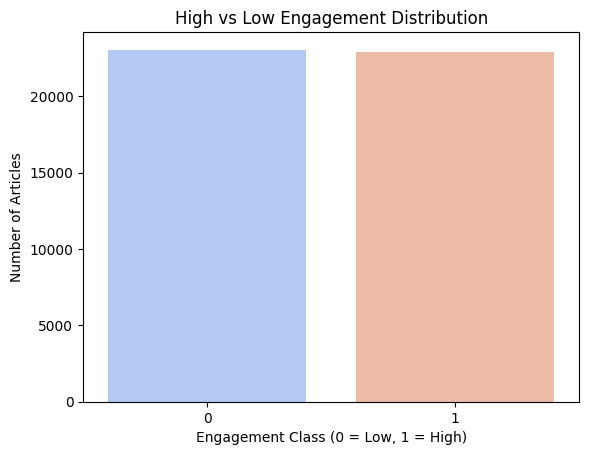

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

# Counts for each value
class_counts = df_clean['high_engagement'].value_counts()

# Checking percentages
for label, count in class_counts.items():
    pct = (count / len(df)) * 100
    print(f"Class {label}: {count} samples ({pct:.2f}%)")

# Plotting the distribution
sns.barplot(x=class_counts.index, y=class_counts.values, palette="coolwarm")
plt.title("High vs Low Engagement Distribution")
plt.xlabel("Engagement Class (0 = Low, 1 = High)")
plt.ylabel("Number of Articles")
plt.show()


* Class 1: 49.78% and Class 0: 50.04%
* They're almost perfectly balanced, hence there is not much biasedness.
Proceeding with the same (It is a GIVEN, since we used the Median especially - still confirmed it)

##### Removing stopwords from `title_cleaned`

In [53]:
typical_article_words = ['concepts','method',
                         'understanding','part', 'data', 'science', 'way','using',
                         'know','work','approach','problem','based',
                         'better','get', 'function',
                         'use', 'simple','minute','step','V',
                         'getting','started','first','line', 'scientists',
                         'new','need',
                         'like' ]

In [54]:
stop_words = set(stopwords.words('english'))
stop_words.update(typical_article_words)

def remove_stopwords(text):
  # Split the title into words
  words = text.split()
  # Keep the words that are NOT in stop_words
  filtered_words = [word for word in words if word not in stop_words]
  # Join back into a single string
  return ' '.join(filtered_words)

In [55]:
# Apply it to the DataFrame
df_clean['title_cleaned'] = df_clean['title_cleaned'].apply(remove_stopwords)

In [56]:
X_text = df_clean['title_cleaned'].values
X_text[:5]

array(['feature engineering modeling python',
       'tensorflow developer certified',
       'scientist guide efficient coding python',
       'preprocessing pandas pipe',
       'best practices write readable maintainable sql code'],
      dtype=object)

In [57]:
y = df_clean['high_engagement'].values
y[:5]

array([1, 0, 1, 1, 1])

#### Tokenizing
* Convert words to numbers

In [58]:
# Vocabulary of the 5000 most common words (everything other than that - rare)
vocab_size = 5000
# Another hyperparameter - max_len
max_len = 20


`max_len`
* Each title is of different length.
* Once we convert the words to tokens (numbers), and we feed them to the network, the network can't really work with a variable number of inputs.
* Since the Neural Networds need fixed-size input vectors, we set max_len so that every title/text will be represented as exactly a sequence of `max_len` tokens.
* If the title/text is shorter than `max_len` words, it is padded with zeros at the end (or start, depending on the `padding` argument)

In [59]:
tokenizer = Tokenizer(num_words = vocab_size, oov_token = '<OOV>')
tokenizer.fit_on_texts(X_text)

* `oov_token= '<OOV>'` : if a work is seen that was not in the training data (we're not familiar with it), then replace it with this special token meaning "ou of vocabulary"

Tokenizer works by:
* Reading all the text data in X_text
* Splits them into individual words (based on spaces).
* Counts how often each word appears
* Sorts them by frequency (high frequency word appears first)
* Creats a word index dictionary: {'word': its order based on the frequency value of the word,i.e., its index}

In [60]:
c = 0
for key, value in tokenizer.word_index.items():
  c = c + 1
  print(key, value)
  if c==5:
    break

<OOV> 1
learning 2
python 3
machine 4
ai 5


* The lower the ID, the more frequent the word
* OOV is 1, because when we set oov_token as OOV, then it automaticaly reserves index 1 for OOV

Converting the text into sequences of integers, based on the `max_len` mentioned earlier (if len < max_len, padding is used)

In [61]:
X_sequences = tokenizer.texts_to_sequences(X_text)
X_padded = pad_sequences(X_sequences, maxlen=max_len, padding='post', truncating='post')

In [62]:
X_sequences[0]

[56, 103, 81, 3]

In [63]:
X_padded[0]

array([ 56, 103,  81,   3,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0], dtype=int32)

#### Train - Test Split

In [68]:
X_train, X_test, y_train, y_test = train_test_split(
    X_padded, y, test_size=0.2, random_state=42
)

#### CNN Model

In [69]:
from keras.layers import Embedding, Conv1D, GlobalMaxPooling1D

In [70]:
CNNmodel = Sequential()
CNNmodel.add(Embedding(vocab_size, 128, input_length = max_len))
CNNmodel.add(Conv1D(128, 5, activation = 'relu'))
CNNmodel.add(GlobalMaxPooling1D())
CNNmodel.add(Dense(64, activation = 'relu'))
CNNmodel.add(Dropout(0.5))
CNNmodel.add(Dense(1, activation = 'sigmoid'))


/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(
2025-10-17 09:53:51.353966: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4
2025-10-17 09:53:51.354102: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-10-17 09:53:51.354110: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2025-10-17 09:53:51.354273: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-10-17 09:53:51.354289: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <unde

In [71]:
CNNmodel.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [65]:
from keras.callbacks import EarlyStopping

In [73]:
# Early Stopping
estop = EarlyStopping(
    monitor = 'val_loss',
    patience = 5,
    restore_best_weights = True
)

In [74]:
history = CNNmodel.fit(
    X_train, y_train,
    epochs=200,
    batch_size=32,
    validation_split=0.2,
    verbose=1,
    callbacks = [estop]
)

Epoch 1/200


2025-10-17 09:54:12.120312: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


920/920 ━━━━━━━━━━━━━━━━━━━━ 13s 11ms/step - accuracy: 0.5575 - loss: 0.6813 - val_accuracy: 0.5993 - val_loss: 0.6638
Epoch 2/200
920/920 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.6455 - loss: 0.6271 - val_accuracy: 0.5975 - val_loss: 0.6703
Epoch 3/200
920/920 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.7416 - loss: 0.5118 - val_accuracy: 0.5809 - val_loss: 0.7986
Epoch 4/200
920/920 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.8338 - loss: 0.3555 - val_accuracy: 0.5720 - val_loss: 1.0264
Epoch 5/200
920/920 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.8917 - loss: 0.2484 - val_accuracy: 0.5648 - val_loss: 1.3195
Epoch 6/200
920/920 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.9159 - loss: 0.1949 - val_accuracy: 0.5688 - val_loss: 1.4861


In [75]:
test_loss, test_acc = CNNmodel.evaluate(X_test, y_test)
print(f"\nTest Accuracy: {test_acc:.4f}")

288/288 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5913 - loss: 0.6643

Test Accuracy: 0.5913


* Overfitting present in the data

In [66]:
early_stop = EarlyStopping(
    monitor='val_loss',      # stop when val_loss stops improving
    patience=2,              # wait 2 epochs
    restore_best_weights=True
)

##### Hyperparameter Tuning for embedding dimensions, filters, kernel size, dense units and dropout values

In [ ]:
from keras import layers
configs = [
    # (embedding_dim, filters, kernel_size, dense_units, dropout)
    (64, 32, 3, 32, 0.3),    # very light
    (64, 64, 3, 64, 0.4),    # light
    (128, 64, 3, 64, 0.5),   # medium
]


results = []

for i, (emb_dim, filters, kernel, dense, drop) in enumerate(configs):
    print(f"\n{'='*50}")
    print(f"Testing config {i+1}: emb={emb_dim}, filters={filters}, kernel={kernel}, dense={dense}, dropout={drop}")

    # Build model
    model = keras.Sequential([
        layers.Embedding(vocab_size, emb_dim, input_length=max_len),
        layers.Conv1D(filters, kernel, activation='relu'),
        layers.GlobalMaxPooling1D(),
        layers.Dense(dense, activation='relu'),
        layers.Dropout(drop),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Train with EarlyStopping
    history = model.fit(
        X_train, y_train,
        epochs=20,               
        batch_size=128,
        validation_split=0.2,
        callbacks=[early_stop],
        verbose=1
    )

    # Evaluate
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
    val_acc = history.history['val_accuracy'][-1]

    results.append({
        'config': i+1,
        'test_acc': test_acc,
        'val_acc': val_acc,
        'params': (emb_dim, filters, kernel, dense, drop)
    })

    print(f"Val Acc: {val_acc:.4f} | Test Acc: {test_acc:.4f}")

# Best config
best = max(results, key=lambda x: x['test_acc'])
print(f"\nBest config: {best['config']} with test acc: {best['test_acc']:.4f}")
print(f"Parameters: {best['params']}")



Testing config 1: emb=64, filters=32, kernel=3, dense=32, dropout=0.3
Epoch 1/20


/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/layers/core/embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


230/230 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5544 - loss: 0.6834 - val_accuracy: 0.6017 - val_loss: 0.6656
Epoch 2/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6508 - loss: 0.6286 - val_accuracy: 0.5960 - val_loss: 0.6687
Epoch 3/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7410 - loss: 0.5289 - val_accuracy: 0.5873 - val_loss: 0.7301
Val Acc: 0.5873 | Test Acc: 0.5987

Testing config 2: emb=64, filters=64, kernel=3, dense=64, dropout=0.4
Epoch 1/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5533 - loss: 0.6831 - val_accuracy: 0.5961 - val_loss: 0.6629
Epoch 2/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6425 - loss: 0.6318 - val_accuracy: 0.5953 - val_loss: 0.6647
Epoch 3/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7310 - loss: 0.5404 - val_accuracy: 0.5796 - val_loss: 0.7233
Val Acc: 0.5796 | Test Acc: 0.6014

Testing config 3: emb=128, filters=64, kernel=3, dense=64, dropout=0.5
Epoch 1/20
230/230 ━━━━━

* Overfitting has significantly reduced: Training Accuracy: 0.6571 and Test Accuracy: 0.5989
* Continuing to check if we can get a better model

##### Using GlobalAveragePooling instead of GlobalMaxPooling could help with overfitting

In [79]:
configs = [
    # (embedding_dim, dense_units, dropout)
    (64, 32, 0.3),
    (64, 64, 0.4),
    (128, 64, 0.5),
]
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=2,
    restore_best_weights=True
)

In [80]:
results = []

for i, (emb_dim, dense, drop) in enumerate(configs):
    print(f"\n{'='*50}")
    print(f"Testing config {i+1}: emb={emb_dim}, dense={dense}, dropout={drop}")

    # Building the model
    model = keras.Sequential([
        layers.Embedding(vocab_size, emb_dim, input_length=max_len),
        layers.GlobalAveragePooling1D(),   # simpler than Conv1D + MaxPooling
        layers.Dense(dense, activation='relu'),
        layers.Dropout(drop),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Train
    history = model.fit(
        X_train, y_train,
        epochs=20,               
        batch_size=128,
        validation_split=0.2,
        callbacks=[early_stop],
        verbose=1
    )

    # Evaluate
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
    val_acc = history.history['val_accuracy'][-1]

    results.append({
        'config': i+1,
        'test_acc': test_acc,
        'val_acc': val_acc,
        'params': (emb_dim, dense, drop)
    })

    print(f"Val Acc: {val_acc:.4f} | Test Acc: {test_acc:.4f}")

# Best config
best = max(results, key=lambda x: x['test_acc'])
print(f"\nBest config: {best['config']} with test acc: {best['test_acc']:.4f}")
print(f"Parameters: {best['params']}")




Testing config 1: emb=64, dense=32, dropout=0.3
Epoch 1/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5315 - loss: 0.6904 - val_accuracy: 0.5743 - val_loss: 0.6814
Epoch 2/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5898 - loss: 0.6692 - val_accuracy: 0.5891 - val_loss: 0.6672
Epoch 3/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.6298 - loss: 0.6438 - val_accuracy: 0.5957 - val_loss: 0.6671
Epoch 4/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.6526 - loss: 0.6237 - val_accuracy: 0.5978 - val_loss: 0.6697
Epoch 5/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.6672 - loss: 0.6111 - val_accuracy: 0.5946 - val_loss: 0.6792
Val Acc: 0.5946 | Test Acc: 0.5914

Testing config 2: emb=64, dense=64, dropout=0.4
Epoch 1/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5249 - loss: 0.6908 - val_accuracy: 0.5494 - val_loss: 0.6834
Epoch 2/20
230/230 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5894 - loss: 0.6711 - val_

* The above model (3) is the one that has the least amount of overfitting
* But as a trade off, the accuracy in general has went down
* This could be because of the fact that the titles are short and the model might be having trouble learning from them

##### Creating additional features and seeing if that'll help improve the CNN model

1. Using `VADER` (Valence Aware Dictionary and sEntiment Reasoner) (previous experience with VADER - SET project)
* It is a tool for sentiment analysis, which is most often used on the social media texts.
* It returns a compound score, which ranges from -1 to 1, which shows us the general direction of the sentiment of the given text

In [67]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
vader = SentimentIntensityAnalyzer()

In [68]:
# Some of the important words for a title
high_value_words = ['guide','tutorial','tips','how','best','step','example']

In [69]:
# word count
df_clean['title_len_words'] = df_clean['title_cleaned'].apply(lambda x: len(x.split()))
df_clean[['title_len_words', 'title_cleaned']]

,title_len_words,title_cleaned
0,4,feature engineering modeling python
1,3,tensorflow developer certified
2,5,scientist guide efficient coding python
3,3,preprocessing pandas pipe
4,7,best practices write readable maintainable sql...
...,...,...
45990,5,deep learning feedforward neural network
45991,5,big deliver big returns agriculture
45992,7,really possible ai sales marketing beyond hype
45993,6,opening neural network black box perceptron


In [70]:
# total number of characters in text
df_clean['title_len_chars'] = df_clean['title_cleaned'].apply(len)
df_clean[['title_len_words', 'title_cleaned','title_len_chars']]

,title_len_words,title_cleaned,title_len_chars
0,4,feature engineering modeling python,35
1,3,tensorflow developer certified,30
2,5,scientist guide efficient coding python,39
3,3,preprocessing pandas pipe,25
4,7,best practices write readable maintainable sql...,51
...,...,...,...
45990,5,deep learning feedforward neural network,40
45991,5,big deliver big returns agriculture,35
45992,7,really possible ai sales marketing beyond hype,46
45993,6,opening neural network black box perceptron,43


In [71]:
# Number of uppercases in the original title column
df_clean['num_uppercase'] = df_clean['title'].apply(lambda x: sum(1 for c in str(x) if c.isupper()))
df_clean[['num_uppercase', 'title']]

,num_uppercase,title
0,4,Feature Engineering & Modeling in Python
1,4,Getting TensorFlow Developer certified
2,2,Data scientist’s guide to efficient coding in ...
3,7,A Better Way for Data Preprocessing: Pandas Pipe
4,9,10 Best Practices to Write Readable and Mainta...
...,...,...
45990,5,Deep Learning: Feedforward Neural Network
45991,8,Can Big-Data Deliver Big-Returns For Agriculture?
45992,9,What’s Really Possible with AI for Sales and M...
45993,6,Opening the Neural Network Black Box — Perceptron


In [72]:
# Number of exclamations in the original title text
df_clean['num_exclamations'] = df_clean['title'].apply(lambda x: str(x).count('!'))
df_clean[[ 'title', 'num_exclamations']]

,title,num_exclamations
0,Feature Engineering & Modeling in Python,0
1,Getting TensorFlow Developer certified,0
2,Data scientist’s guide to efficient coding in ...,0
3,A Better Way for Data Preprocessing: Pandas Pipe,0
4,10 Best Practices to Write Readable and Mainta...,0
...,...,...
45990,Deep Learning: Feedforward Neural Network,0
45991,Can Big-Data Deliver Big-Returns For Agriculture?,0
45992,What’s Really Possible with AI for Sales and M...,0
45993,Opening the Neural Network Black Box — Perceptron,0


In [73]:
# The compound score from vader
df_clean['sentiment_compound'] = df_clean['title_cleaned'].apply(lambda x: vader.polarity_scores(x)['compound'])

In [74]:
df_clean[[ 'title_cleaned', 'sentiment_compound']]

,title_cleaned,sentiment_compound
0,feature engineering modeling python,0.0000
1,tensorflow developer certified,0.0000
2,scientist guide efficient coding python,0.4215
3,preprocessing pandas pipe,0.0000
4,best practices write readable maintainable sql...,0.6369
...,...,...
45990,deep learning feedforward neural network,0.0000
45991,big deliver big returns agriculture,0.0000
45992,really possible ai sales marketing beyond hype,0.0000
45993,opening neural network black box perceptron,0.0000


* Most of the titles are having a compound score of 0
* That could be because VADER was designed to work with expressive social media texts
* Trying to get the polarity (-1 to 1 : Negative to Positive tone) score and subjectivity (0 to 1: objective to opinionated) scores

In [75]:
from textblob import TextBlob

df_clean['polarity'] = df_clean['title_cleaned'].apply(lambda x: TextBlob(x).sentiment.polarity)
df_clean['subjectivity'] = df_clean['title_cleaned'].apply(lambda x: TextBlob(x).sentiment.subjectivity)

In [76]:
df_clean[[ 'title_cleaned', 'polarity','subjectivity']]

,title_cleaned,polarity,subjectivity
0,feature engineering modeling python,0.000000,0.000000
1,tensorflow developer certified,0.000000,0.000000
2,scientist guide efficient coding python,0.000000,0.000000
3,preprocessing pandas pipe,0.000000,0.000000
4,best practices write readable maintainable sql...,1.000000,0.300000
...,...,...,...
45990,deep learning feedforward neural network,0.000000,0.400000
45991,big deliver big returns agriculture,0.000000,0.100000
45992,really possible ai sales marketing beyond hype,0.000000,1.000000
45993,opening neural network black box perceptron,-0.166667,0.433333


In [77]:
df_clean.columns

Index(['publish_date', 'title', 'author', 'url', 'claps', 'responses',
       'reading_time', 'paid', 'log_claps', 'title_cleaned', 'year', 'month',
       'day', 'high_engagement', 'title_len_words', 'title_len_chars',
       'num_uppercase', 'num_exclamations', 'sentiment_compound', 'polarity',
       'subjectivity'],
      dtype='object')

In [78]:
df_clean['num_keywords_present'] = df_clean['title_cleaned'].apply(lambda x: sum(word in x for word in high_value_words))
df_clean['keyword_ratio'] = df_clean.apply(lambda r: r['num_keywords_present'] / r['title_len_words'] if r['title_len_words'] > 0 else 0, axis=1)

In [79]:
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,...,high_engagement,title_len_words,title_len_chars,num_uppercase,num_exclamations,sentiment_compound,polarity,subjectivity,num_keywords_present,keyword_ratio
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling python,...,1,4,35,4,0,0.0000,0.0,0.0,0,0.000000
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,tensorflow developer certified,...,0,3,30,4,0,0.0000,0.0,0.0,0,0.000000
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910,scientist guide efficient coding python,...,1,5,39,2,0,0.4215,0.0,0.0,1,0.200000
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,preprocessing pandas pipe,...,1,3,25,7,0,0.0000,0.0,0.0,0,0.000000
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices write readable maintainable sql...,...,1,7,51,9,0,0.6369,1.0,0.3,1,0.142857


In [80]:
numeric_features = [
    'title_len_words','title_len_chars','num_exclamations','num_uppercase',
    'polarity','subjectivity','num_keywords_present','keyword_ratio'
]

Numerical features - scaling

In [81]:
X_num = df_clean[numeric_features].fillna(0).values
scaler = StandardScaler()
X_num_scaled = scaler.fit_transform(X_num)

The text data

In [82]:
X_text = df_clean['title_cleaned'].values
y = df_clean['high_engagement'].values

In [83]:
tokenizer = Tokenizer(num_words=vocab_size, oov_token='<OOV>')
tokenizer.fit_on_texts(X_text)
X_seq = tokenizer.texts_to_sequences(X_text)
X_pad = pad_sequences(X_seq, maxlen=max_len, padding='post', truncating='post')

In [84]:
X_train_text, X_test_text, X_train_num, X_test_num, y_train, y_test = train_test_split(
    X_pad, X_num_scaled, y, test_size=0.2, random_state=42
)

#### 3. The Hybrid CNN model 

In [85]:
from tensorflow.keras import regularizers

In [86]:
text_input = keras.Input(shape=(max_len,))
num_input = keras.Input(shape=(X_train_num.shape[1],))

In [88]:
from keras import layers

In [92]:
# Text branch
x = layers.Embedding(vocab_size, 128, input_length=max_len)(text_input)
x = layers.Conv1D(64, 5, activation='relu', kernel_regularizer=regularizers.l2(0.002))(x)
x = layers.GlobalMaxPooling1D()(x)

# Combining with the numeric branch
combined = layers.concatenate([x, num_input])
combined = layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.004))(combined)
combined = layers.Dropout(0.5)(combined)
output = layers.Dense(1, activation='sigmoid')(combined)

model = keras.Model(inputs=[text_input, num_input], outputs=output)

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 20)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_1         │ (None, 20, 128)   │    640,000 │ input_layer_1[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 16, 64)    │     41,024 │ embedding_1[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 64)        │          0 │ conv1d_1[0][0]    │
│ (GlobalMaxPooling1… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 8)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 72)        │          0 │ global_max_pooli… │
│ (Concatenate)       │                   │            │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 32)        │      2,336 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 32)        │          0 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 1)         │         33 │ dropout_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 683,393 (2.61 MB)

 Trainable params: 683,393 (2.61 MB)

 Non-trainable params: 0 (0.00 B)

In [93]:
early_stop = keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=5, restore_best_weights=True
)


In [94]:
history = model.fit(
    [X_train_text, X_train_num], y_train,
    epochs=50,
    batch_size=128,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)


Epoch 1/50
230/230 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - accuracy: 0.5051 - loss: 0.8407 - val_accuracy: 0.5243 - val_loss: 0.7161
Epoch 2/50
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.5055 - loss: 0.7175 - val_accuracy: 0.5294 - val_loss: 0.6996
Epoch 3/50
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.5065 - loss: 0.7020 - val_accuracy: 0.5171 - val_loss: 0.6959
Epoch 4/50
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.5054 - loss: 0.6975 - val_accuracy: 0.5196 - val_loss: 0.6936
Epoch 5/50
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.5154 - loss: 0.6947 - val_accuracy: 0.5323 - val_loss: 0.6926
Epoch 6/50
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.5124 - loss: 0.6942 - val_accuracy: 0.5217 - val_loss: 0.6923
Epoch 7/50
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.5137 - loss: 0.6934 - val_accuracy: 0.5225 - val_loss: 0.6922
Epoch 8/50
230/230 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.5112 - loss: 0.6935 - val_accu

* accuracy: 0.5216 - loss: 0.6923 - val_accuracy: 0.5218 - val_loss: 0.6916
* Overfitting has significantly reduced, but so did the accuracy in general
* Next Step would be getting the actual content for these articles so that we can use them to perform better engagement classification and even attempt topic classification using CNNs

#### Topic Trends Over Time
* Since there's no information on the content to actually start working with, we are extracting a few topics based on keywords

In [95]:
def get_topic(title):
    title = title.lower()
    if 'deep learning' in title or 'neural network' in title:
        return 'Deep Learning'
    elif 'machine learning' in title or 'ml' in title:
        return 'Machine Learning'
    elif 'python' in title or 'pandas' in title:
        return 'Python'
    elif 'covid' in title or 'coronavirus' in title or 'pandemic' in title:
        return 'COVID'
    elif 'nlp' in title or 'natural language' in title:
        return 'NLP'
    else:
        return 'Other'

df_clean['simple_topic'] = df_clean['title_cleaned'].apply(get_topic)

In [97]:
df_clean[['title_cleaned','simple_topic']]

,title_cleaned,simple_topic
0,feature engineering modeling python,Python
1,tensorflow developer certified,Other
2,scientist guide efficient coding python,Python
3,preprocessing pandas pipe,Python
4,best practices write readable maintainable sql...,Other
...,...,...
45990,deep learning feedforward neural network,Deep Learning
45991,big deliver big returns agriculture,Other
45992,really possible ai sales marketing beyond hype,Other
45993,opening neural network black box perceptron,Deep Learning


In [98]:
df_clean['simple_topic'].value_counts()

simple_topic
Other               32674
Python               5136
Machine Learning     4316
Deep Learning        2554
NLP                   686
COVID                 628
Name: count, dtype: int64

Visualizing the topics over time

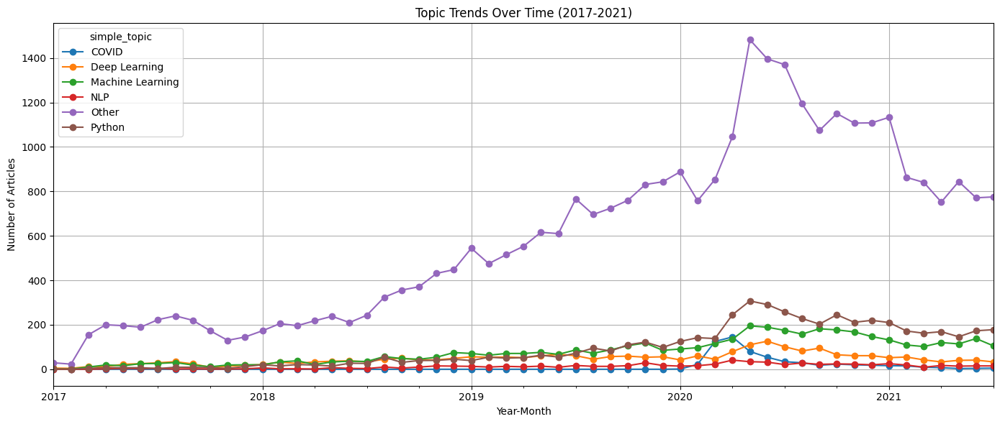

In [ ]:
# articles by topic per month
df_clean['year_month'] = df_clean['publish_date'].dt.to_period('M') # eg: 2017-01
topic_trends = df_clean.groupby(['year_month', 'simple_topic']).size().unstack(fill_value=0)

# Visualize
import matplotlib.pyplot as plt
topic_trends.plot(figsize=(14, 6), marker='o')
plt.title('Topic Trends Over Time (2017-2021)')
plt.xlabel('Year-Month')
plt.ylabel('Number of Articles')
plt.grid(True)
plt.tight_layout()
plt.show()

Visualizing the Engagement by Topic over time

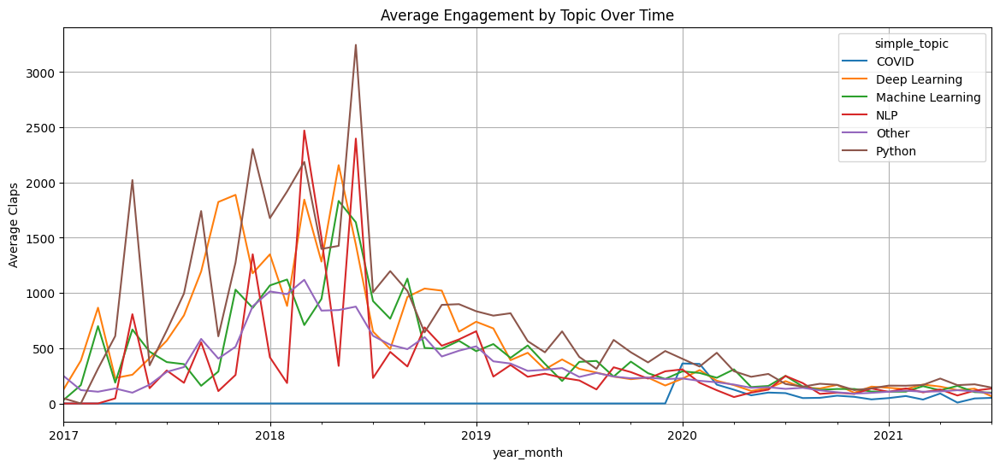

In [106]:
# Average claps per topic per month
engagement_trends = df_clean.groupby(['year_month', 'simple_topic'])['claps'].mean().unstack(fill_value=0)
engagement_trends.plot(figsize=(14, 6))
plt.title('Average Engagement by Topic Over Time')
plt.ylabel('Average Claps')
plt.grid()
plt.show()

### 4. LSTM for topic trend forecasting
* To predict future article counts for one topic, here: Deep Learning, over time

In [107]:
from tensorflow.keras.layers import LSTM

Preparing time series data for `Deep Learning` topic

In [ ]:
# Get the rows where only Deep Learning is mentioned
topic_data = df_clean[df_clean['simple_topic'] == 'Deep Learning'].groupby('year_month').size()
topic_data = topic_data.sort_index()

In [112]:
topic_data[:5]

year_month
2017-01     5
2017-02     4
2017-03    12
2017-04    12
2017-05    22
Freq: M, dtype: int64

In [ ]:
# Thus we get a monthly time series, with the values indicating how often the topic was mentioned that month
print(f"Time series length: {len(topic_data)}")
print(topic_data.head())

Time series length: 55
year_month
2017-01     5
2017-02     4
2017-03    12
2017-04    12
2017-05    22
Freq: M, dtype: int64


* Scaling the values to a small range, since neural networks work better when the data is scaled to a small range.

In [115]:
# Normalizing the data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1)) 
scaled_data = scaler.fit_transform(topic_data.values.reshape(-1, 1))

Use data from the previous 3 months to predict the 4th month's data
* This is just a starting assumption as to how far back the data likely matters (domain knowledge) - in monthly article trends, maybe the last few months' interest influences next month's interest - but older data may not matter much.
* We could treat is as a hyperparameter as well

In [116]:
def create_sequences(data, lookback=3):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i-lookback:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

In [117]:
# Sequences for LSTM
lookback = 3
X, y = create_sequences(scaled_data, lookback)

In [118]:
# Reshape for LSTM [samples, timesteps, features]
X = X.reshape((X.shape[0], X.shape[1], 1))

In [119]:
print(f"X shape: {X.shape}, y shape: {y.shape}")

X shape: (52, 3, 1), y shape: (52,)


In [120]:
# Train-test split (NOT shuffling)
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

Building the LSTM model

In [124]:
model = Sequential()
model.add(LSTM(50, activation = 'relu', return_sequences = True,
               input_shape = (lookback, 1)))
model.add(Dropout(0.2))
model.add(LSTM(50, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(optimizer = 'adam', loss = 'mse',
              metrics= ['mae'])
model.summary()

/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 3, 50)          │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 3, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,651 (119.73 KB)

 Trainable params: 30,651 (119.73 KB)

 Non-trainable params: 0 (0.00 B)

Training the model

In [125]:
estop = EarlyStopping(
    monitor='val_loss',     
    patience=5,             # stop if no improvement after 5 epochs
    restore_best_weights=True  
)


In [126]:
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=16,
    validation_data=(X_test, y_test),
    verbose=1, 
    callbacks = [estop]
) # not using a separate validation dataset

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 201ms/step - loss: 0.1688 - mae: 0.3564 - val_loss: 0.1681 - val_mae: 0.3850
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.1591 - mae: 0.3431 - val_loss: 0.1566 - val_mae: 0.3705
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.1502 - mae: 0.3303 - val_loss: 0.1460 - val_mae: 0.3565
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1415 - mae: 0.3171 - val_loss: 0.1352 - val_mae: 0.3415
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1314 - mae: 0.3034 - val_loss: 0.1236 - val_mae: 0.3246
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1223 - mae: 0.2891 - val_loss: 0.1111 - val_mae: 0.3056
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1117 - mae: 0.2703 - val_loss: 0.0979 - val_mae: 0.2841
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.1017 - mae: 0.2555 - val_loss: 0.0839 - val_mae: 0.2595
Epoch 9/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0878 - mae: 0.2342 -

* loss: 0.0329 - mae: 0.1414 - val_loss: 0.0094 - val_mae: 0.0810
* MAE is around 0.08, i.e., if the original (unscaled) article counts ranged between 10 and 100, then 1 becomes 100 and 0 becomes 10, so the scale range is about 90
* Then, MAE = 0.08 * 90 = 7.2 articles. Thus the model's prediction would be off by around 7 articles only

#### Checking predictions

In [127]:
pred = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


In [130]:
# Scaling back to get the actual values
predictions = scaler.inverse_transform(pred)
y_test_actual = scaler.inverse_transform(y_test.reshape(-1,1))

Visualizing predictions

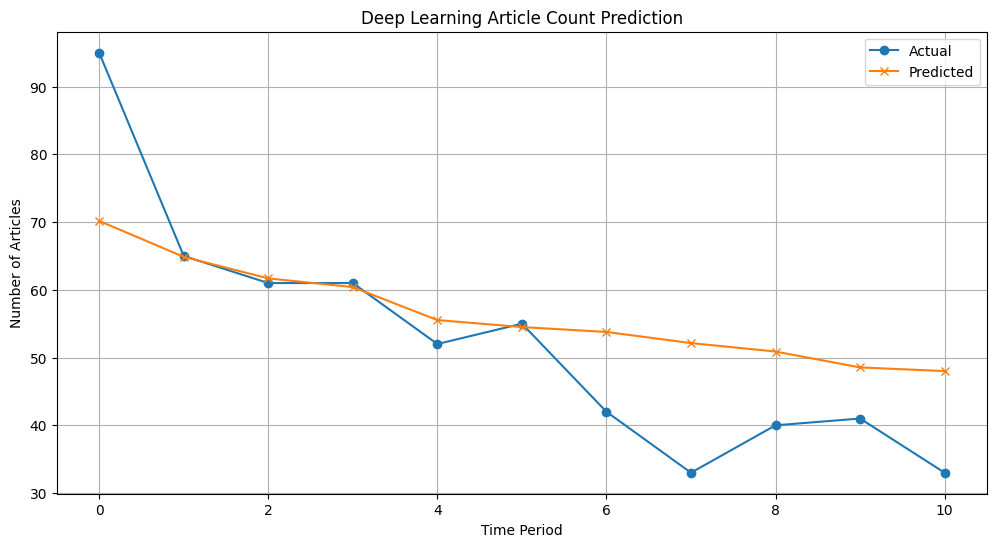

In [131]:
plt.figure(figsize=(12, 6))
plt.plot(y_test_actual, label='Actual', marker='o')
plt.plot(predictions, label='Predicted', marker='x')
plt.title('Deep Learning Article Count Prediction')
plt.xlabel('Time Period')
plt.ylabel('Number of Articles')
plt.legend()
plt.grid(True)
plt.show()

* We can see that the predictions are following the general downward trend of the actual values
* The predictions have been smoothed out as well - so the model could have been averaging the short term fluctuations out
* It is not overfitting the data (because its not following the actual line as it is), but it could be underfitting a little bit because of the difference in prediction for the first point (x-axis 0)

### Trying with a lookback value of 4

In [156]:
# Sequences for LSTM
lookback = 4
X, y = create_sequences(scaled_data, lookback)

In [157]:
# Reshape for LSTM [samples, timesteps, features]
X = X.reshape((X.shape[0], X.shape[1], 1))
print(f"X shape: {X.shape}, y shape: {y.shape}")

X shape: (51, 4, 1), y shape: (51,)


In [158]:
# Train-test split (NOT shuffling)
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

LSTM model

In [159]:
model = Sequential()
model.add(LSTM(50, activation = 'relu', return_sequences = True,
               input_shape = (lookback, 1)))
model.add(Dropout(0.2))
model.add(LSTM(50, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(optimizer = 'adam', loss = 'mse',
              metrics= ['mae'])
model.summary()

/Users/aiswaryasuresh/miniforge3/envs/tf/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_10 (LSTM)                  │ (None, 4, 50)          │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 4, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,651 (119.73 KB)

 Trainable params: 30,651 (119.73 KB)

 Non-trainable params: 0 (0.00 B)

In [160]:
estop = EarlyStopping(
    monitor='val_loss',     
    patience=5,             # stop if no improvement after 5 epochs
    restore_best_weights=True  
)


In [161]:
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=16,
    validation_data=(X_test, y_test),
    verbose=1, 
    callbacks = [estop]
) 

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 202ms/step - loss: 0.1698 - mae: 0.3597 - val_loss: 0.1609 - val_mae: 0.3762
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.1562 - mae: 0.3410 - val_loss: 0.1435 - val_mae: 0.3531
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1428 - mae: 0.3208 - val_loss: 0.1260 - val_mae: 0.3284
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1292 - mae: 0.3009 - val_loss: 0.1083 - val_mae: 0.3013
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1127 - mae: 0.2752 - val_loss: 0.0903 - val_mae: 0.2713
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0975 - mae: 0.2517 - val_loss: 0.0721 - val_mae: 0.2371
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0827 - mae: 0.2241 - val_loss: 0.0541 - val_mae: 0.1980
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0704 - mae: 0.1996 - val_loss: 0.0373 - val_mae: 0.1532
Epoch 9/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0557 - mae: 0.1725 -

* loss: 0.0291 - mae: 0.1402 - val_loss: 0.0135 - val_mae: 0.1061

In [162]:
pred = model.predict(X_test)
# Scaling back to get the actual values
predictions = scaler.inverse_transform(pred)
y_test_actual = scaler.inverse_transform(y_test.reshape(-1,1))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


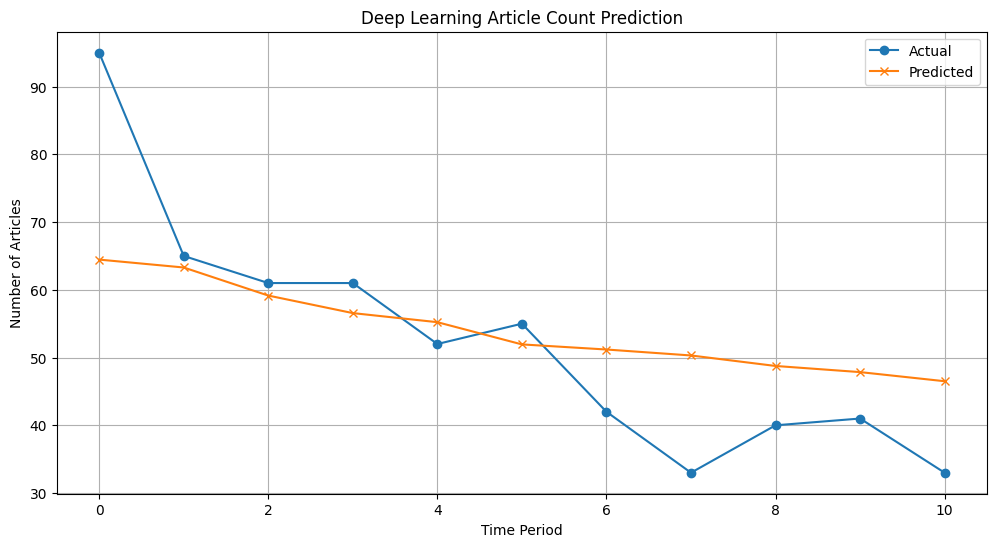

In [163]:
plt.figure(figsize=(12, 6))
plt.plot(y_test_actual, label='Actual', marker='o')
plt.plot(predictions, label='Predicted', marker='x')
plt.title('Deep Learning Article Count Prediction')
plt.xlabel('Time Period')
plt.ylabel('Number of Articles')
plt.legend()
plt.grid(True)
plt.show()

* The model seems to fit better compared to the previous LSTM model with lookback = 3
* This model is adapting more closely to the actual changes

#### Next Steps:
1. Getting the article content (scraping the TDS website) for the articles in the dataset from 2017-2021
2. Get more data (scraping) from 2022-2025 to get the latest insights

### Scraping the urls that we already have in the dataset

In [53]:
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860


In [33]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import time
from urllib.parse import urlparse
import logging
from concurrent.futures import ThreadPoolExecutor, as_completed

# Setup logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

class TDSScraper:
    def __init__(self, delay=1):
        self.delay = delay  # Delay between requests (be respectful)
        self.session = requests.Session()
        self.session.headers.update({
            'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36'
        })
    
    def check_url_status(self, url):
        """Check if URL is accessible"""
        try:
            response = self.session.head(url, timeout=5, allow_redirects=True)
            return response.status_code
        except requests.RequestException:
            return None
    
    def extract_article_slug(self, url):
        """Extract the article slug from URL"""
        # Format: https://towardsdatascience.com/slug-here/
        parts = url.rstrip('/').split('/')
        return parts[-1] if parts else None
    
    def try_url_variants(self, original_url):
        """Try different URL formats to handle Medium -> standalone migration"""
        slug = self.extract_article_slug(original_url)
        if not slug:
            return None
        
        variants = [
            original_url,  # Original URL
            f"https://towardsdatascience.com/{slug}/",  # Standalone format
            f"https://towardsdatascience.com/{slug}",   # Without trailing slash
        ]
        
        for url in variants:
            status = self.check_url_status(url)
            if status == 200:
                logger.info(f"✓ Found working URL: {url}")
                return url
        
        return None
    
    def scrape_article(self, url):
        """Scrape article content from TDS"""
        working_url = self.try_url_variants(url)
        
        if not working_url:
            logger.warning(f"✗ Could not find working URL for: {url}")
            return None
        
        try:
            response = self.session.get(working_url, timeout=10)
            response.raise_for_status()
            
            soup = BeautifulSoup(response.content, 'html.parser')
            
            # Find the main content container
            content_div = soup.find('div', class_='wp-block-post-content')
            if not content_div:
                logger.warning(f"Content div not found in: {working_url}")
                return None
            
            # Extract all content elements in order (paragraphs, headings, lists)
            content_elements = []
            
            for element in content_div.find_all(['p', 'h2', 'h3', 'h4', 'ol', 'ul']):
                text = None
                
                if element.name in ['p', 'h2', 'h3', 'h4']:
                    # For headings and paragraphs, get text directly
                    if element.name == 'p' and 'wp-block-paragraph' in element.get('class', []):
                        text = element.get_text().strip()
                    elif element.name in ['h2', 'h3', 'h4']:
                        # Add heading with markdown-style formatting
                        heading_level = int(element.name[1])
                        heading_text = element.get_text().strip()
                        text = f"\n{'#' * heading_level} {heading_text}\n"
                    
                elif element.name in ['ol', 'ul']:
                    # For lists, extract list items
                    list_items = element.find_all('li')
                    if list_items:
                        list_type = '1.' if element.name == 'ol' else '-'
                        list_text = []
                        for idx, li in enumerate(list_items, 1):
                            li_text = li.get_text().strip()
                            if element.name == 'ol':
                                list_text.append(f"{idx}. {li_text}")
                            else:
                                list_text.append(f"- {li_text}")
                        text = '\n'.join(list_text)
                
                if text:
                    content_elements.append(text)
            
            if not content_elements:
                logger.warning(f"No content elements found in: {working_url}")
                return None
            
            # Join all elements with double newlines for readability
            article_text = '\n\n'.join(content_elements)
            
            # Extract title (usually in h1 or og:title meta tag)
            title = None
            h1 = soup.find('h1')
            if h1:
                title = h1.get_text().strip()
            
            # Extract author (common meta tags)
            author = None
            author_meta = soup.find('meta', attrs={'name': 'author'})
            if author_meta:
                author = author_meta.get('content')
            
            return {
                'url': working_url,
                'title': title,
                'author': author,
                'content': article_text,
                'content_length': len(article_text),
                'status': 'success'
            }
            
        except requests.RequestException as e:
            logger.error(f"Request failed for {working_url}: {e}")
            return None
    
    def scrape_batch(self, urls, max_retries=3):
        """Scrape multiple URLs with error handling"""
        results = []
        
        for idx, url in enumerate(urls, 1):
            logger.info(f"Processing {idx}/{len(urls)}: {url}")
            
            article_data = self.scrape_article(url)
            
            if article_data:
                results.append(article_data)
            else:
                results.append({
                    'url': url,
                    'title': None,
                    'author': None,
                    'content': None,
                    'content_length': 0,
                    'status': 'failed'
                })
            
            time.sleep(self.delay)  # Be respectful to the server
        
        return results
    
    def scrape_batch_parallel(self, urls, max_workers=8):
        """Scrape multiple URLs in parallel for faster processing"""
        results = {url: None for url in urls}
        completed = 0
        
        with ThreadPoolExecutor(max_workers=max_workers) as executor:
            future_to_url = {executor.submit(self.scrape_article, url): url for url in urls}
            
            for future in as_completed(future_to_url):
                url = future_to_url[future]
                completed += 1
                
                try:
                    article_data = future.result()
                    if article_data:
                        results[url] = article_data
                    else:
                        results[url] = {
                            'url': url,
                            'title': None,
                            'author': None,
                            'content': None,
                            'content_length': 0,
                            'status': 'failed'
                        }
                except Exception as e:
                    logger.error(f"Error processing {url}: {e}")
                    results[url] = {
                        'url': url,
                        'title': None,
                        'author': None,
                        'content': None,
                        'content_length': 0,
                        'status': 'failed'
                    }
                
                if completed % 50 == 0:
                    logger.info(f"Progress: {completed}/{len(urls)} articles processed")
        
        return list(results.values())


##### Applying the functions on the column `url` from the `df_clean` dataset

In [34]:
# Usage example
if __name__ == "__main__":
    # Assuming you have df_clean already loaded
    # df_clean = pd.read_csv('your_dataset.csv')
    
    # Initialize scraper
    scraper = TDSScraper(delay=0.3)  # Reduced delay for faster scraping
    
    # Get URLs from df_clean
    urls = df_clean['url'].tolist()
    
    print(f"=== Starting to scrape {len(urls)} articles ===\n")
    
    # Scrape articles using parallel processing (8 concurrent workers)
    results = scraper.scrape_batch_parallel(urls, max_workers=8)
    
    # Convert results to DataFrame
    df_results = pd.DataFrame(results)
    
    # Add 'content' column to df_clean from scraped results
    df_clean['content'] = df_results['content'].values
    
    # Optionally add other useful columns
    df_clean['content_length'] = df_results['content_length'].values
    df_clean['scrape_status'] = df_results['status'].values
    
    print("\n=== Results Summary ===")
    print(f"Total articles: {len(df_clean)}")
    print(f"Successful scrapes: {(df_clean['scrape_status'] == 'success').sum()}")
    print(f"Failed scrapes: {(df_clean['scrape_status'] == 'failed').sum()}")
    print(f"\nDataFrame shape: {df_clean.shape}")
    print(f"\nFirst few rows:")
    print(df_clean[['url', 'content_length', 'scrape_status']].head())
    
    # Save updated dataframe
    df_clean.to_csv('df_clean_with_content.csv', index=False)
    print("\nUpdated dataframe saved to df_clean_with_content.csv")

=== Starting to scrape 45994 articles ===



2025-10-20 16:51:26,875 - INFO - ✓ Found working URL: https://towardsdatascience.com/getting-tensorflow-developer-certified-3975d1a26050
2025-10-20 16:51:26,894 - INFO - ✓ Found working URL: https://towardsdatascience.com/solve-sudoku-using-linear-programming-python-pulp-b41b29f479f3
2025-10-20 16:51:27,084 - INFO - ✓ Found working URL: https://towardsdatascience.com/titanic-feature-engineering-modeling-in-python-6749e6e87bf4
2025-10-20 16:51:27,233 - INFO - ✓ Found working URL: https://towardsdatascience.com/a-better-way-for-data-preprocessing-pandas-pipe-a08336a012bc
2025-10-20 16:51:27,290 - WARNING - ✗ Could not find working URL for: https://towardsdatascience.com/pandas-hacks-that-i-wish-i-had-when-i-started-out-1f942caa9792
2025-10-20 16:51:27,442 - WARNING - ✗ Could not find working URL for: https://towardsdatascience.com/data-scientists-guide-to-efficient-coding-in-python-670c78a7bf79
2025-10-20 16:51:27,546 - WARNING - ✗ Could not find working URL for: https://towardsdatascien


=== Results Summary ===
Total articles: 45994
Successful scrapes: 12205
Failed scrapes: 33789

DataFrame shape: (45994, 13)

First few rows:
                                                 url  content_length  \
0  https://towardsdatascience.com/titanic-feature...            5086   
1  https://towardsdatascience.com/getting-tensorf...            9754   
2  https://towardsdatascience.com/data-scientists...               0   
3  https://towardsdatascience.com/a-better-way-fo...            3551   
4  https://towardsdatascience.com/10-best-practic...            7278   

  scrape_status  
0       success  
1       success  
2        failed  
3       success  
4       success  

Updated dataframe saved to df_clean_with_content.csv


In [40]:
df_clean[['url','title','content']].head()

,url,title,content
0,https://towardsdatascience.com/titanic-feature...,Feature Engineering & Modeling in Python,"In this article, I’ll walk through how to buil..."
1,https://towardsdatascience.com/getting-tensorf...,Getting TensorFlow Developer certified,"After preparing for a long time, I recently to..."
2,https://towardsdatascience.com/data-scientists...,Data scientist’s guide to efficient coding in ...,None
3,https://towardsdatascience.com/a-better-way-fo...,A Better Way for Data Preprocessing: Pandas Pipe,Real-life data is usually messy. It requires a...
4,https://towardsdatascience.com/10-best-practic...,10 Best Practices to Write Readable and Mainta...,It’s easy to mess with SQL without proper guid...


* The articles where content = `None` are having their urls either deleted or removed
* On opening such urls, we're getting the message that `Apologies, but something went wrong on our end`.
* https://medium.com/data-science/data-scientists-guide-to-efficient-coding-in-python-670c78a7bf79 - and the url changed too

In [45]:
print(f"Successful articles: {(df_clean['scrape_status'] == 'success').sum()}")
df_clean_success = df_clean[df_clean['scrape_status'] == 'success'].copy()
print(f"Using {len(df_clean_success)} articles for topic classification")
df_clean_success.to_csv('df_clean_successful_only.csv', index=False)

Successful articles: 12205
Using 12205 articles for topic classification


In [46]:
df_clean.to_csv('tds_and_content.csv',index = False)

#### 5. CNNs to predict Engagement (High/Low) using title+content

In [ ]:
# Filter out articles where content is the string 'None'
df_clean = df_clean[df_clean['content'] != 'None']

# Double check
print(f"Articles with content: {len(df_clean)}")
print(f"Sample content length: {len(df_clean['content'].iloc[0])}")

# Also check for other variations just in case
df_clean = df_clean[df_with_content['content'].str.len() > 10]  # At least some real content
print(f"After length filter: {len(df_clean)}") 

Articles with content: 45994
Sample content length: 5086
After length filter: 12205


In [48]:
# You already have the right dataframe
print(f"Working with {len(df_with_content)} articles with real content")

Working with 12205 articles with real content


### Importing the updated dataset having the article content

In [102]:
import pandas as pd

In [103]:
df_clean = pd.read_csv('tds_and_content.csv')

In [104]:
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910,data scientist s guide to efficient coding in ...,NaN,0,failed
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success


* Combining text and content into one column

In [105]:
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910,data scientist s guide to efficient coding in ...,NaN,0,failed
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success


In [106]:
import re
def clean_text(text):
    if pd.isna(text) or not isinstance(text, str):
        return ""
    
    # Convert to lowercase
    text = text.lower()
    
    # Remove HTML tags
    text = re.sub(r'<[^>]+>', ' ', text)
    
    # Remove URLs
    text = re.sub(r'http\S+|www\.\S+', ' ', text)
    
    # Remove email addresses
    text = re.sub(r'\S+@\S+', ' ', text)
    
    # Remove special characters but keep basic punctuation
    text = re.sub(r'[^a-z0-9\s\.!?,\']', ' ', text)
    
    # Remove extra whitespace
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

# Clean content if not already done
if 'content_cleaned' not in df_clean.columns:
    print("Cleaning content...")
    df_clean['content_cleaned'] = df_clean['content'].apply(clean_text)

# Create full_text from cleaned fields
df_clean['full_text_cleaned'] = (
    df_clean['title_cleaned'].astype(str) + ' ' + 
    df_clean['content_cleaned'].astype(str)
)

Cleaning content...


In [107]:
df_clean.columns

Index(['publish_date', 'title', 'author', 'url', 'claps', 'responses',
       'reading_time', 'paid', 'log_claps', 'title_cleaned', 'content',
       'content_length', 'scrape_status', 'content_cleaned',
       'full_text_cleaned'],
      dtype='object')

In [108]:
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status,content_cleaned,full_text_cleaned
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success,"in this article, i ll walk through how to buil...",feature engineering modeling in python in this...
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success,"after preparing for a long time, i recently to...",getting tensorflow developer certified after p...
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910,data scientist s guide to efficient coding in ...,NaN,0,failed,,data scientist s guide to efficient coding in ...
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success,real life data is usually messy. it requires a...,a better way for data preprocessing pandas pip...
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success,it s easy to mess with sql without proper guid...,best practices to write readable and maintaina...


In [109]:
# 1. Filter to valid content only
df_with_content = df_clean[
    (df_clean['content_cleaned'].notna()) & 
    (df_clean['content_cleaned'].str.len() > 100) # greater than 100 chars in length
].copy()

# 2. Create full_text_cleaned
df_with_content['full_text_cleaned'] = (
    df_with_content['title_cleaned'].astype(str) + ' ' + 
    df_with_content['content_cleaned'].astype(str)
)

In [110]:
print(f"Training on {len(df_with_content)} records with valid content")

Training on 12203 records with valid content


In [112]:
df_with_content.to_csv('df_content_2017_2021.csv', index = False)

In [111]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import models as keras # Or just 'import tensorflow.keras as keras' and access layers via 'keras.layers'
from tensorflow.keras import layers

In [14]:
vocab_size = 10000 # larger vocab
max_len = 200 

In [ ]:
# 3. Tokenize
tokenizer = Tokenizer(num_words=vocab_size, oov_token='<OOV>')
tokenizer.fit_on_texts(df_with_content['full_text_cleaned'])

X_sequences = tokenizer.texts_to_sequences(df_with_content['full_text_cleaned'])
X_padded = pad_sequences(X_sequences, maxlen=max_len, padding='post', truncating='post')

In [16]:
# 4. Prepare target
median_claps = df_with_content['log_claps'].median()
y = (df_with_content['log_claps'] > median_claps).astype(int)

print(f"Class distribution: High={y.sum()}, Low={(y==0).sum()}")

Class distribution: High=6093, Low=6110


In [18]:
from sklearn.model_selection import train_test_split
# 5. Continue with train-test split and modeling...
X_train, X_test, y_train, y_test = train_test_split(
    X_padded, y, test_size=0.2, random_state=42
)

print(f"Train: {len(X_train)}, Test: {len(X_test)}")

Train: 9762, Test: 2441


In [19]:
df_with_content.shape

(12203, 15)

##### Simple CNN Architecture

In [39]:
import keras
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, GlobalAveragePooling1D, GlobalMaxPooling1D, Dense, Dropout, Embedding, SpatialDropout1D
from keras.regularizers import l2
from keras.optimizers import Adam

In [75]:
model = Sequential()
model.add(Embedding(vocab_size, 64, input_length = max_len))
model.add(SpatialDropout1D(0.5))
model.add(Conv1D(64, 5, activation = 'relu', kernel_regularizer=l2(0.001)))
model.add(MaxPooling1D(2))
model.add(Conv1D(64, 5, activation='relu', kernel_regularizer=l2(0.001)))
model.add(GlobalMaxPooling1D())
model.add(Dense(64,activation='relu', kernel_regularizer=l2(0.004) ))
model.add(Dropout(0.5))
model.add(Dense(1, activation = 'sigmoid'))

In [76]:
model.compile(
    optimizer=Adam(learning_rate = 0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [77]:
model.summary()

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_12 (Embedding)        │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout1d_12            │ ?                      │             0 │
│ (SpatialDropout1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_23 (Conv1D)              │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_12 (MaxPooling1D) │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_24 (Conv1D)              │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_10         │ ?                      │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [78]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-10)
]

In [79]:
history = model.fit(
    X_train, y_train,
    epochs=30,
    batch_size=128,
    validation_split=0.2,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.4990 - loss: 1.0598 - val_accuracy: 0.5125 - val_loss: 1.0429 - learning_rate: 1.0000e-04
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.5069 - loss: 1.0307 - val_accuracy: 0.5008 - val_loss: 1.0166 - learning_rate: 1.0000e-04
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4987 - loss: 1.0060 - val_accuracy: 0.5003 - val_loss: 0.9926 - learning_rate: 1.0000e-04
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4976 - loss: 0.9832 - val_accuracy: 0.5003 - val_loss: 0.9706 - learning_rate: 1.0000e-04
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.5126 - loss: 0.9615 - val_accuracy: 0.5018 - val_loss: 0.9503 - learning_rate: 1.0000e-04
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5162 - loss: 0.9416 - val_accuracy: 0.5003 - val_loss: 0.9313 - learning_rate: 1.0000e-04
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.5074 

* The training and validation accuracies are close together and stable: model is not overfitting
* The accuracy is better than the previous model (52%), but still only just better than random guessing
* Trying to see if we can get better results

* train accuracy: 0.5763 - loss: 0.7140 - val_accuracy: 0.5745 - val_loss: 0.7099 - learning_rate: 1.0000e-04

---

#### Baseline Model

In [56]:
# Simple baseline to compare against
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_features=5000)
X_tfidf = tfidf.fit_transform(df_with_content['full_text'])

X_tr, X_te, y_tr, y_te = train_test_split(X_tfidf, y, test_size=0.2, random_state=42)
lr = LogisticRegression(max_iter=1000)
lr.fit(X_tr, y_tr)
print(f"Logistic Regression accuracy: {lr.score(X_te, y_te):.4f}")

Logistic Regression accuracy: 0.6342


* Trying a simplified model to beat the baseline model without overfitting

In [89]:
model = Sequential()
model.add(Embedding(vocab_size, 32, input_length=max_len))
model.add(SpatialDropout1D(0.4))
model.add(Conv1D(32, 5, activation='relu', kernel_regularizer=l2(0.01)))
model.add(GlobalMaxPooling1D())
model.add(Dropout(0.5))
model.add(Dense(16, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.6))
model.add(Dense(1, activation='sigmoid'))

* SpatialDropout drops entire embedding vectors (whole words) and not individual numbers
* Word embeddings for a sentence → [word1, word2, word3, word4] <br>
SpatialDropout1D(0.2): randomly drops entire word2 or word4 embedding vectors (sets them to zero)
* Completely remove word features during training - "pretend we didn't see this word"
* This reduces overfitting
* Dropout randomly drops individual elements (numbers) in the embedding vectors, i.e., different dimensions of the same word's embedding could be dropped inconsistently. This could introduce noise within word embeddings

In [90]:
model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss='binary_crossentropy',
    metrics=['accuracy']
)
model.summary()

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_16 (Embedding)        │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout1d_7             │ ?                      │             0 │
│ (SpatialDropout1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_23 (Conv1D)              │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_9          │ ?                      │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

* The above `unbuilt` is shown because the model isn't built yet, i.e., Keras doesn't know the input shape yet.

In [91]:
from keras.callbacks import ReduceLROnPlateau

In [92]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
]

In [93]:
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=128,
    validation_split=0.2,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.5039 - loss: 1.1309 - val_accuracy: 0.5387 - val_loss: 1.0233 - learning_rate: 5.0000e-04
Epoch 2/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4942 - loss: 0.9638 - val_accuracy: 0.5525 - val_loss: 0.9022 - learning_rate: 5.0000e-04
Epoch 3/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5122 - loss: 0.8654 - val_accuracy: 0.5428 - val_loss: 0.8300 - learning_rate: 5.0000e-04
Epoch 4/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5071 - loss: 0.8081 - val_accuracy: 0.5474 - val_loss: 0.7857 - learning_rate: 5.0000e-04
Epoch 5/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5157 - loss: 0.7715 - val_accuracy: 0.4977 - val_loss: 0.7578 - learning_rate: 5.0000e-04
Epoch 6/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5036 - loss: 0.7487 - val_accuracy: 0.5448 - val_loss: 0.7392 - learning_rate: 5.0000e-04
Epoch 7/100
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 

* The overfitting has reduced, but so did the overall accuracy
* Validation loss is now 0.6932
* The accuracy from the previous CNN (hybrid) is better than this

In [95]:
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status,full_text
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success,feature engineering modeling in python In this...
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success,getting tensorflow developer certified After p...
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910,data scientist s guide to efficient coding in ...,NaN,0,failed,NaN
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success,a better way for data preprocessing pandas pip...
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success,best practices to write readable and maintaina...


#### Trying a Hybrid CNN model combining both numerical features and the full_text

In [ ]:
# Filter out invalid entries
df_clean = df_clean[df_clean['full_text_cleaned'].str.len() > 10].copy()

print(f"Rows after cleaning and filtering: {len(df_clean)}")
print(f"Sample full_text:\n{df_clean['full_text'].iloc[0][:200]}...")

Cleaning content...
Rows after cleaning and filtering: 45913
Sample full_text:
feature engineering modeling in python In this article, I’ll walk through how to build models to predict the survival status of the Titanic passengers in Python. The methodology used here could also b...


In [10]:
df_clean.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status,content_cleaned,full_text_cleaned
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success,"in this article, i ll walk through how to buil...",feature engineering modeling in python in this...
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success,"after preparing for a long time, i recently to...",getting tensorflow developer certified after p...
2,2021-07-31,Data scientist’s guide to efficient coding in ...,Dr. Varshita Sher,https://towardsdatascience.com/data-scientists...,1200,4,11,1,7.090910,data scientist s guide to efficient coding in ...,NaN,0,failed,,data scientist s guide to efficient coding in ...
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success,real life data is usually messy. it requires a...,a better way for data preprocessing pandas pip...
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success,it s easy to mess with sql without proper guid...,best practices to write readable and maintaina...


In [11]:
df_clean.columns

Index(['publish_date', 'title', 'author', 'url', 'claps', 'responses',
       'reading_time', 'paid', 'log_claps', 'title_cleaned', 'content',
       'content_length', 'scrape_status', 'content_cleaned',
       'full_text_cleaned'],
      dtype='object')

In [12]:
df_with_content.shape

(12203, 15)

In [13]:
df_with_content.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status,content_cleaned,full_text_cleaned
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success,"in this article, i ll walk through how to buil...",feature engineering modeling in python in this...
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success,"after preparing for a long time, i recently to...",getting tensorflow developer certified after p...
3,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success,real life data is usually messy. it requires a...,a better way for data preprocessing pandas pip...
4,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success,it s easy to mess with sql without proper guid...,best practices to write readable and maintaina...
6,2021-07-31,Solve Sudoku using Linear Programming (Python ...,Lakshmi Ajay,https://towardsdatascience.com/solve-sudoku-us...,111,1,5,0,4.718499,solve sudoku using linear programming python pulp,\n### Exploiting the concepts of linear progra...,5933,success,exploiting the concepts of linear programming ...,solve sudoku using linear programming python p...


#### Creating numerical features (the same ones as created earlier)

In [14]:
# Some of the important words for a title
high_value_words = ['guide','tutorial','tips','how','best','step','example']

In [16]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
vader = SentimentIntensityAnalyzer()

In [18]:
from textblob import TextBlob

In [19]:
df_with_content['title_len_words'] = df_with_content['title_cleaned'].apply(lambda x: len(str(x).split()))
df_with_content['title_len_chars'] = df_with_content['title_cleaned'].apply(lambda x: len(str(x)))
df_with_content['num_uppercase'] = df_with_content['title'].apply(lambda x: sum(1 for c in str(x) if c.isupper()))
df_with_content['num_exclamations'] = df_with_content['title'].apply(lambda x: str(x).count('!'))
df_with_content['sentiment_compound'] = df_with_content['title_cleaned'].apply(lambda x: vader.polarity_scores(str(x))['compound'])
df_with_content['polarity'] = df_with_content['title_cleaned'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)
df_with_content['subjectivity'] = df_with_content['title_cleaned'].apply(lambda x: TextBlob(str(x)).sentiment.subjectivity)
df_with_content['num_keywords_present'] = df_with_content['title_cleaned'].apply(lambda x: sum(word in str(x) for word in high_value_words))
df_with_content['keyword_ratio'] = df_with_content.apply(
    lambda r: r['num_keywords_present'] / r['title_len_words'] if r['title_len_words'] > 0 else 0, 
    axis=1
)

Content-specific features

In [20]:
df_with_content['content_len_words'] = df_with_content['content_cleaned'].apply(lambda x: len(str(x).split()))
df_with_content['content_len_chars'] = df_with_content['content_cleaned'].apply(lambda x: len(str(x)))

Preparing the features

In [21]:
numeric_features = [
    'title_len_words', 'title_len_chars', 'num_exclamations', 'num_uppercase',
    'polarity', 'subjectivity', 'num_keywords_present', 'keyword_ratio',
    'content_len_words', 'content_len_chars',  # NEW: content features
    'reading_time', 'paid'  # Original features
]

In [23]:
from sklearn.preprocessing import StandardScaler

In [24]:
X_num = df_with_content[numeric_features].fillna(0).values
scaler = StandardScaler()
X_num_scaled = scaler.fit_transform(X_num)

In [25]:
# 4. Prepare text data 
X_text = df_with_content['full_text_cleaned'].values

In [27]:
X_text[:5]

array(['feature engineering modeling in python in this article, i ll walk through how to build models to predict the survival status of the titanic passengers in python. the methodology used here could also be applied to other similar use cases. for added context, you can refer to the previous article, exploratory data analysis visualization in python, to read more about the titanic data exploration and visualization in python. the titanic data can be downloaded from the kaggle website. 1. handling missing data there are 4 predictors that contain missing data age, fare, cabin, and embarked. age for the missing data in age, we can 1 refill the n a values with mean or median, or 2 categorize the n a values as a separate category. i chose the second option given that the n a category could have useful information for predicting the survival status. the missing data in age was categorized as a category. for the remaining non missing values, one way to categorize them is by manually definin

In [28]:
# 5. Define high engagement
median_claps = df_with_content['log_claps'].median()
y = (df_with_content['log_claps'] > median_claps).astype(int)

In [29]:
print(f"High: {y.sum()}, Low: {(y==0).sum()}")

High: 6093, Low: 6110


In [30]:
# 6. Tokenize full text
vocab_size = 10000
max_len = 200  # Longer for full content

tokenizer = Tokenizer(num_words=vocab_size, oov_token='<OOV>')
tokenizer.fit_on_texts(X_text)
X_seq = tokenizer.texts_to_sequences(X_text)
X_pad = pad_sequences(X_seq, maxlen=max_len, padding='post', truncating='post')


In [33]:
from sklearn.model_selection import train_test_split
# 7. Train-test split
X_train_text, X_test_text, X_train_num, X_test_num, y_train, y_test = train_test_split(
    X_pad, X_num_scaled, y, test_size=0.2, random_state=42
)

import keras 
# 8. Build hybrid model
text_input = keras.Input(shape=(max_len,), name='text_input')
num_input = keras.Input(shape=(X_train_num.shape[1],), name='num_input')

In [128]:
# Text branch (CNN on full content)
x = layers.Embedding(vocab_size, 128)(text_input)
x = layers.SpatialDropout1D(0.3)(x)
x = layers.Conv1D(128, 5, activation='relu')(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(64, 5, activation='relu')(x)
x = layers.GlobalMaxPooling1D()(x)

In [129]:
# Numeric branch
n = layers.Dense(32, activation='relu')(num_input)

from keras.regularizers import l2
# Combine
combined = layers.concatenate([x, n])
combined = layers.Dense(64, activation='relu', kernel_regularizer = l2(0.001))(combined)
combined = layers.Dropout(0.3)(combined)
output = layers.Dense(1, activation='sigmoid')(combined)


In [130]:
from keras.optimizers import Adam
model = keras.Model(inputs=[text_input, num_input], outputs=output)
model.compile(optimizer=Adam(learning_rate = 0.0001), loss='binary_crossentropy', metrics=['accuracy'])

In [131]:
from keras.callbacks import EarlyStopping
estop = EarlyStopping(monitor = 'val_loss', patience = 2,
                      restore_best_weights=True)

In [132]:
# Training the model
history = model.fit(
    [X_train_text, X_train_num], y_train,
    validation_split=0.2,
    epochs=10,
    batch_size=32,
    verbose=1, callbacks =[estop]
)

Epoch 1/10
245/245 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.5273 - loss: 0.8030 - val_accuracy: 0.5515 - val_loss: 0.7617
Epoch 2/10
245/245 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5358 - loss: 0.7733 - val_accuracy: 0.5673 - val_loss: 0.7448
Epoch 3/10
245/245 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5469 - loss: 0.7617 - val_accuracy: 0.5704 - val_loss: 0.7312
Epoch 4/10
245/245 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5541 - loss: 0.7472 - val_accuracy: 0.5725 - val_loss: 0.7193
Epoch 5/10
245/245 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5572 - loss: 0.7404 - val_accuracy: 0.5812 - val_loss: 0.7131
Epoch 6/10
245/245 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5677 - loss: 0.7304 - val_accuracy: 0.5832 - val_loss: 0.7039
Epoch 7/10
245/245 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5789 - loss: 0.7205 - val_accuracy: 0.5878 - val_loss: 0.6988
Epoch 8/10
245/245 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5965 - loss: 0.7071 - val_accu

* accuracy: 0.6242 - loss: 0.6796 - val_accuracy: 0.6011 - val_loss: 0.6853

In [133]:
from sklearn.metrics import classification_report, roc_auc_score

y_pred = (model.predict([X_test_text, X_test_num]) > 0.5).astype(int)
print(classification_report(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_pred))


77/77 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
              precision    recall  f1-score   support

           0       0.64      0.55      0.59      1256
           1       0.59      0.67      0.63      1185

    accuracy                           0.61      2441
   macro avg       0.61      0.61      0.61      2441
weighted avg       0.62      0.61      0.61      2441

ROC-AUC: 0.6130065978661077


* Overfitting is low, Accuracy and ROC-AUC are consistent
* Model has learned some useful signals and is not guessing

## Next Phase

### 1. Scraped article content for the articles from years 2022-2025

* Scraping directly from TDS url year wise was challenging, and hence resorted to using the `TDS Archives` https://medium.com/data-science/all?year=2024 (replacing the year in the url accordingly for 2022-2025 data)
* Extracted articles from Towards Data Science from the years 2022-2025
* Included similar columns as in the previous dataset (2017-2021) structure (for concatenation purposes), but fields like publish_date, claps, responses, and paid were given a value of NaN. Because
* publish_date - instead of extracting the entire date, decided to extract just the year, since this is an analysis at the year level
*  claps, responses, and paid - TDS used to work with Medium earlier. Since their separation, TDS doesn't have said metrics

## Content dataset

In [120]:
import pandas as pd
content = pd.read_csv('combinedyears_content.csv')
content.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,content,Year
0,NaN,SQL Concepts that Beginners Have Trouble With,Julia Kho,https://medium.com/data-science/sql-concepts-t...,NaN,NaN,7,NaN,SQL Concepts that Beginners Have Trouble With ...,2022
1,NaN,Implementing Word2vec in PyTorch from the Grou...,Jonah Breslow,https://medium.com/data-science/implementing-w...,NaN,NaN,22,NaN,Implementing Word2vec in PyTorch from the Grou...,2022
2,NaN,Reinforcement Learning for Inventory Optimizat...,Guangrui Xie,https://medium.com/data-science/reinforcement-...,NaN,NaN,20,NaN,Reinforcement Learning for Inventory Optimizat...,2022
3,NaN,Torch and Torchvision C++ installation and deb...,Alexey Kravets,https://medium.com/data-science/torch-and-torc...,NaN,NaN,8,NaN,Torch and Torchvision C++ installation and deb...,2022
4,NaN,What Is Better: One General Model or Many Spec...,Samuele Mazzanti,https://medium.com/data-science/what-is-better...,NaN,NaN,10,NaN,What Is Better: One General Model or Many Spec...,2022


In [121]:
content['Year'].value_counts()

Year
2024    2967
2025    2967
2022     208
2023      10
Name: count, dtype: int64

* Was only able to extract very few articles from 2023. Unequal distribution of article counts is an obvious limitation here.
* Scraping wasn't able to pick up articles for some years because of the structural changes made in TDS recently.

In [122]:
content.shape

(6152, 10)

Cleaning the `title` and the `content` fields

In [10]:
import re

In [124]:
def clean_text(text):
    if pd.isna(text) or text == 'None' or text == '':
        return ''
    text = str(text)
    # Remove HTML tags
    text = re.sub(r'<[^>]+>', '', text)
    # Remove URLs
    text = re.sub(r'http\S+|www\S+', '', text)
    # Remove non-breaking spaces and special whitespace
    text = text.replace('\xa0', ' ')
    text = text.replace('\n', ' ')
    text = text.replace('\t', ' ')
    # Remove special characters but keep alphanumeric and spaces
    text = re.sub(r'[^a-zA-Z0-9\s]', ' ', text)
    # Remove extra whitespace
    text = ' '.join(text.split())
    # converting to lowecase
    text = text.lower()
    
    return text

In [125]:
content['cleaned_title'] = content['title'].apply(clean_text)
content['cleaned_content'] = content['content'].apply(clean_text)

In [126]:
content.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,content,Year,cleaned_title,cleaned_content
0,NaN,SQL Concepts that Beginners Have Trouble With,Julia Kho,https://medium.com/data-science/sql-concepts-t...,NaN,NaN,7,NaN,SQL Concepts that Beginners Have Trouble With ...,2022,sql concepts that beginners have trouble with,sql concepts that beginners have trouble with ...
1,NaN,Implementing Word2vec in PyTorch from the Grou...,Jonah Breslow,https://medium.com/data-science/implementing-w...,NaN,NaN,22,NaN,Implementing Word2vec in PyTorch from the Grou...,2022,implementing word2vec in pytorch from the grou...,implementing word2vec in pytorch from the grou...
2,NaN,Reinforcement Learning for Inventory Optimizat...,Guangrui Xie,https://medium.com/data-science/reinforcement-...,NaN,NaN,20,NaN,Reinforcement Learning for Inventory Optimizat...,2022,reinforcement learning for inventory optimizat...,reinforcement learning for inventory optimizat...
3,NaN,Torch and Torchvision C++ installation and deb...,Alexey Kravets,https://medium.com/data-science/torch-and-torc...,NaN,NaN,8,NaN,Torch and Torchvision C++ installation and deb...,2022,torch and torchvision c installation and debug...,torch and torchvision c installation and debug...
4,NaN,What Is Better: One General Model or Many Spec...,Samuele Mazzanti,https://medium.com/data-science/what-is-better...,NaN,NaN,10,NaN,What Is Better: One General Model or Many Spec...,2022,what is better one general model or many speci...,what is better one general model or many speci...


In [127]:
# Combining cleaned title + cleaned content into one column
content['cleaned_full_text'] = (content['cleaned_title']+ ' ' + content['cleaned_content'])
content.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,content,Year,cleaned_title,cleaned_content,cleaned_full_text
0,NaN,SQL Concepts that Beginners Have Trouble With,Julia Kho,https://medium.com/data-science/sql-concepts-t...,NaN,NaN,7,NaN,SQL Concepts that Beginners Have Trouble With ...,2022,sql concepts that beginners have trouble with,sql concepts that beginners have trouble with ...,sql concepts that beginners have trouble with ...
1,NaN,Implementing Word2vec in PyTorch from the Grou...,Jonah Breslow,https://medium.com/data-science/implementing-w...,NaN,NaN,22,NaN,Implementing Word2vec in PyTorch from the Grou...,2022,implementing word2vec in pytorch from the grou...,implementing word2vec in pytorch from the grou...,implementing word2vec in pytorch from the grou...
2,NaN,Reinforcement Learning for Inventory Optimizat...,Guangrui Xie,https://medium.com/data-science/reinforcement-...,NaN,NaN,20,NaN,Reinforcement Learning for Inventory Optimizat...,2022,reinforcement learning for inventory optimizat...,reinforcement learning for inventory optimizat...,reinforcement learning for inventory optimizat...
3,NaN,Torch and Torchvision C++ installation and deb...,Alexey Kravets,https://medium.com/data-science/torch-and-torc...,NaN,NaN,8,NaN,Torch and Torchvision C++ installation and deb...,2022,torch and torchvision c installation and debug...,torch and torchvision c installation and debug...,torch and torchvision c installation and debug...
4,NaN,What Is Better: One General Model or Many Spec...,Samuele Mazzanti,https://medium.com/data-science/what-is-better...,NaN,NaN,10,NaN,What Is Better: One General Model or Many Spec...,2022,what is better one general model or many speci...,what is better one general model or many speci...,what is better one general model or many speci...


In [128]:
len(content['cleaned_title'][2])

99

In [ ]:
# before filtering
print("Before filtering:")
print(f"Total rows: {len(content)}")
print(f"\nTitle lengths - sample of 10:")
print(content['cleaned_title'].str.len().head(10))
print(f"\nContent lengths - sample of 10:")
print(content['cleaned_content'].str.len().head(10))

# Any issues or not
print(f"\nTitles with length > 5: {(content['cleaned_title'].str.len() > 5).sum()}")
print(f"Content with length > 100: {(content['cleaned_content'].str.len() > 100).sum()}")

# some values
print(f"\nSample cleaned_title:")
print(content['cleaned_title'].iloc[0])
print(f"\nSample cleaned_content (first 200 chars):")
print(content['cleaned_content'].iloc[0][:200])

# data types
print(f"\nData types:")
print(content[['cleaned_title', 'cleaned_content']].dtypes)

Before filtering:
Total rows: 6152

Title lengths - sample of 10:
0    45
1    51
2    99
3    59
4    59
5    71
6    87
7    49
8    53
9    69
Name: cleaned_title, dtype: int64

Content lengths - sample of 10:
0     1158
1    30358
2    24758
3      981
4     1095
5    13907
6    14972
7     1235
8     1106
9     1124
Name: cleaned_content, dtype: int64

Titles with length > 5: 6152
Content with length > 100: 6150

Sample cleaned_title:
sql concepts that beginners have trouble with

Sample cleaned_content (first 200 chars):
sql concepts that beginners have trouble with how do i write sql queries from scratch when there are no hints as a mentor for an online analytics bootcamp i ve had many mentees ask me how do i come up

Data types:
cleaned_title      object
cleaned_content    object
dtype: object


In [ ]:
# Filtering valid articles (title and content as having a minimum length)
content = content[
    (content['cleaned_title'].str.len() > 5) & 
    (content['cleaned_content'].str.len() > 100)
]

In [131]:
content.shape

(6150, 13)

In [132]:
content.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,content,Year,cleaned_title,cleaned_content,cleaned_full_text
0,NaN,SQL Concepts that Beginners Have Trouble With,Julia Kho,https://medium.com/data-science/sql-concepts-t...,NaN,NaN,7,NaN,SQL Concepts that Beginners Have Trouble With ...,2022,sql concepts that beginners have trouble with,sql concepts that beginners have trouble with ...,sql concepts that beginners have trouble with ...
1,NaN,Implementing Word2vec in PyTorch from the Grou...,Jonah Breslow,https://medium.com/data-science/implementing-w...,NaN,NaN,22,NaN,Implementing Word2vec in PyTorch from the Grou...,2022,implementing word2vec in pytorch from the grou...,implementing word2vec in pytorch from the grou...,implementing word2vec in pytorch from the grou...
2,NaN,Reinforcement Learning for Inventory Optimizat...,Guangrui Xie,https://medium.com/data-science/reinforcement-...,NaN,NaN,20,NaN,Reinforcement Learning for Inventory Optimizat...,2022,reinforcement learning for inventory optimizat...,reinforcement learning for inventory optimizat...,reinforcement learning for inventory optimizat...
3,NaN,Torch and Torchvision C++ installation and deb...,Alexey Kravets,https://medium.com/data-science/torch-and-torc...,NaN,NaN,8,NaN,Torch and Torchvision C++ installation and deb...,2022,torch and torchvision c installation and debug...,torch and torchvision c installation and debug...,torch and torchvision c installation and debug...
4,NaN,What Is Better: One General Model or Many Spec...,Samuele Mazzanti,https://medium.com/data-science/what-is-better...,NaN,NaN,10,NaN,What Is Better: One General Model or Many Spec...,2022,what is better one general model or many speci...,what is better one general model or many speci...,what is better one general model or many speci...


In [133]:
print(f"\nCleaned dataset size: {len(content)}")
print(f"\nSample title: {content['cleaned_title'].iloc[0]}")
print(f"\nSample content (first 300 chars): {content['cleaned_content'].iloc[0][:300]}")


Cleaned dataset size: 6150

Sample title: sql concepts that beginners have trouble with

Sample content (first 300 chars): sql concepts that beginners have trouble with how do i write sql queries from scratch when there are no hints as a mentor for an online analytics bootcamp i ve had many mentees ask me how do i come up with sql queries in the real job world when there are no hints provided like in my coursework many 


# 6. Finding how topics progress

## Term Frequency Analysis to find Keywords

In [134]:
from sklearn.feature_extraction.text import TfidfVectorizer

Defining key techonology terms to track
* Providing some keywords and their broad topics, which I want to track: LLMs, Traditional ML, Tools mentioned, and Ethics

In [135]:
tech_keywords = { # list inside dict
    'LLMs': ['llm', 'gpt', 'chatgpt', 'large language model', 'generative ai', 'openai'],
    'Traditional ML': ['linear regression', 'random forest', 'decision tree', 'xgboost', 'svm'],
    'Deep Learning': ['neural network', 'deep learning', 'cnn', 'rnn', 'lstm', 'transformer'],
    'Tools': ['pytorch', 'tensorflow', 'keras', 'scikit learn', 'hugging face'],
    'Ethics/Bias': ['bias', 'fairness', 'ethics', 'responsible ai', 'explainability']
}

Counting keyword mentions per year

In [136]:
def count_keywords(text, keyw):
    text = str(text).lower() # Converting to lowercase
    return sum(1 for kw in keyw if kw in text)

In [137]:
results = []
for category, keywords in tech_keywords.items():
    for year in content['Year'].unique():
        year_data = content[content['Year']== year]
        total_articles = len(year_data)
        mentions = year_data['cleaned_full_text'].apply(
            lambda x: count_keywords (x, keywords)
        ).sum()

        results.append({'Year': year, 'Category': category, 'Mentions': mentions,
                        'Articles':total_articles, 'Mentions_per_Article': mentions/total_articles if total_articles>0 else 0 })


In [138]:
trends_df = pd.DataFrame(results)
trends_df.shape

(20, 5)

In [139]:
trends_df.head()

,Year,Category,Mentions,Articles,Mentions_per_Article
0,2022,LLMs,35,208,0.168269
1,2023,LLMs,6,10,0.600000
2,2024,LLMs,2842,2966,0.958193
3,2025,LLMs,2842,2966,0.958193
4,2022,Traditional ML,29,208,0.139423


Technology Adaption Over Time

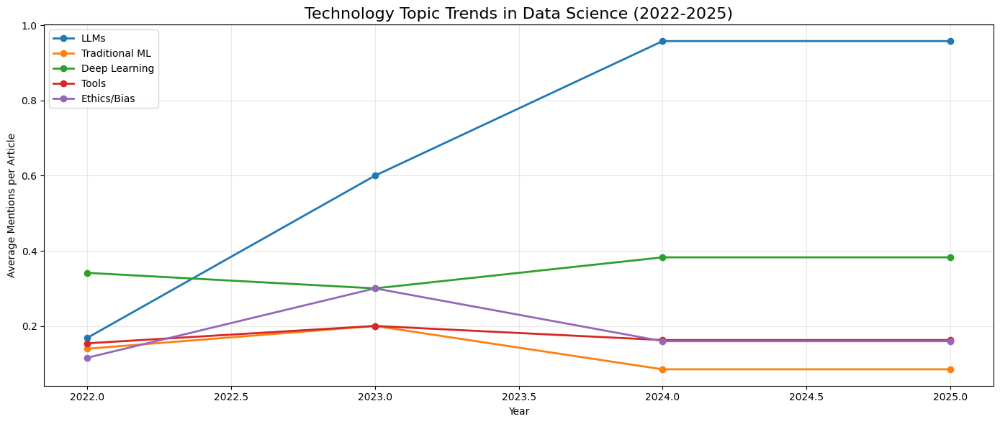

In [140]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 6))
for category in tech_keywords.keys():
    cat_data = trends_df[trends_df['Category'] == category]
    plt.plot(cat_data['Year'], cat_data['Mentions_per_Article'], 
             marker='o', label=category, linewidth=2)

plt.title('Technology Topic Trends in Data Science (2022-2025)', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Average Mentions per Article')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Observations:
* LLMs have gained trajectory and is at the top of its game now in 2025 (Peak: 2024 - 2025)
* Deep Learning has decreased a little from 2022 to 2023, and then increased all the way to 2025, but significantly lower than LLMs
* Ethics/Bias was talked about most in 2023 after which it lowered till (including) 2025
* Traditional ML increased to 2023 and then decreased till 2025
* The mention of tools are relatively lower than others, but it increased from 2022 to 2023 and decreased to 2024 and 2025

Heatmap of keyword frequency by year

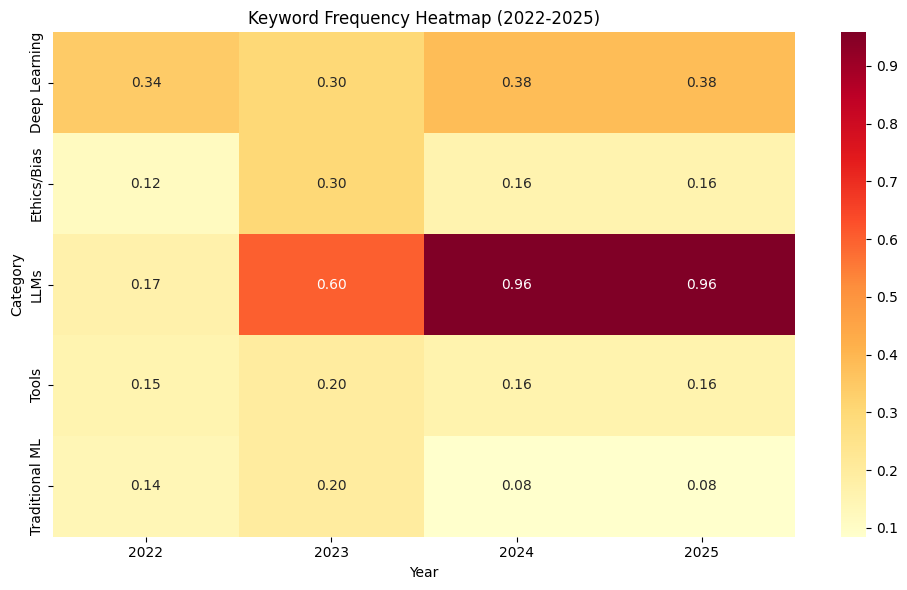

In [141]:
pivot_table = trends_df.pivot(index='Category', columns='Year', values='Mentions_per_Article')
plt.figure(figsize=(10, 6))

import seaborn as sns
sns.heatmap(pivot_table, annot=True, fmt='.2f', cmap='YlOrRd')
plt.title('Keyword Frequency Heatmap (2022-2025)')
plt.tight_layout()
plt.show()

* LLMs have been significantly mentioned about in 2024 and 2025 (0.96 frequency) and was mentioned in 2023 with a frequency of 0.60
* The others have lower keyword frequency values 

### Comparing how the same articles evolved over time from 2017-2021

In [142]:
tech_keywords

{'LLMs': ['llm',
  'gpt',
  'chatgpt',
  'large language model',
  'generative ai',
  'openai'],
 'Traditional ML': ['linear regression',
  'random forest',
  'decision tree',
  'xgboost',
  'svm'],
 'Deep Learning': ['neural network',
  'deep learning',
  'cnn',
  'rnn',
  'lstm',
  'transformer'],
 'Tools': ['pytorch', 'tensorflow', 'keras', 'scikit learn', 'hugging face'],
 'Ethics/Bias': ['bias',
  'fairness',
  'ethics',
  'responsible ai',
  'explainability']}

In [143]:
# Importing data from 2017-2021
df_1721 = pd.read_csv('df_content_2017_2021.csv')
df_1721.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status,content_cleaned,full_text_cleaned
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success,"in this article, i ll walk through how to buil...",feature engineering modeling in python in this...
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success,"after preparing for a long time, i recently to...",getting tensorflow developer certified after p...
2,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success,real life data is usually messy. it requires a...,a better way for data preprocessing pandas pip...
3,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success,it s easy to mess with sql without proper guid...,best practices to write readable and maintaina...
4,2021-07-31,Solve Sudoku using Linear Programming (Python ...,Lakshmi Ajay,https://towardsdatascience.com/solve-sudoku-us...,111,1,5,0,4.718499,solve sudoku using linear programming python pulp,\n### Exploiting the concepts of linear progra...,5933,success,exploiting the concepts of linear programming ...,solve sudoku using linear programming python p...


In [144]:
df_1721.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12203 entries, 0 to 12202
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   publish_date       12203 non-null  object 
 1   title              12203 non-null  object 
 2   author             12203 non-null  object 
 3   url                12203 non-null  object 
 4   claps              12203 non-null  int64  
 5   responses          12203 non-null  int64  
 6   reading_time       12203 non-null  int64  
 7   paid               12203 non-null  int64  
 8   log_claps          12203 non-null  float64
 9   title_cleaned      12203 non-null  object 
 10  content            12203 non-null  object 
 11  content_length     12203 non-null  int64  
 12  scrape_status      12203 non-null  object 
 13  content_cleaned    12203 non-null  object 
 14  full_text_cleaned  12203 non-null  object 
dtypes: float64(1), int64(5), object(9)
memory usage: 1.4+ MB


Creating a `Year` field

In [145]:
df_1721['publish_date'] = pd.to_datetime(df_1721['publish_date'])
df_1721.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12203 entries, 0 to 12202
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   publish_date       12203 non-null  datetime64[ns]
 1   title              12203 non-null  object        
 2   author             12203 non-null  object        
 3   url                12203 non-null  object        
 4   claps              12203 non-null  int64         
 5   responses          12203 non-null  int64         
 6   reading_time       12203 non-null  int64         
 7   paid               12203 non-null  int64         
 8   log_claps          12203 non-null  float64       
 9   title_cleaned      12203 non-null  object        
 10  content            12203 non-null  object        
 11  content_length     12203 non-null  int64         
 12  scrape_status      12203 non-null  object        
 13  content_cleaned    12203 non-null  object        
 14  full_t

In [146]:
df_1721['Year'] = df_1721['publish_date'].dt.year
df_1721.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status,content_cleaned,full_text_cleaned,Year
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success,"in this article, i ll walk through how to buil...",feature engineering modeling in python in this...,2021
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success,"after preparing for a long time, i recently to...",getting tensorflow developer certified after p...,2021
2,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success,real life data is usually messy. it requires a...,a better way for data preprocessing pandas pip...,2021
3,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success,it s easy to mess with sql without proper guid...,best practices to write readable and maintaina...,2021
4,2021-07-31,Solve Sudoku using Linear Programming (Python ...,Lakshmi Ajay,https://towardsdatascience.com/solve-sudoku-us...,111,1,5,0,4.718499,solve sudoku using linear programming python pulp,\n### Exploiting the concepts of linear progra...,5933,success,exploiting the concepts of linear programming ...,solve sudoku using linear programming python p...,2021


In [147]:
df_1721['Year'].value_counts()

Year
2020    5188
2021    4921
2019    1250
2018     570
2017     274
Name: count, dtype: int64

In [148]:
results = []
for category, keywords in tech_keywords.items():
    for year in df_1721['Year'].unique():
        year_data = df_1721[df_1721['Year']== year]
        total_articles = len(year_data)
        mentions = year_data['full_text_cleaned'].apply(
            lambda x: count_keywords (x, keywords)
        ).sum()

        results.append({'Year': year, 'Category': category, 'Mentions': mentions,
                        'Articles':total_articles, 'Mentions_per_Article': mentions/total_articles if total_articles>0 else 0 })


In [149]:
trends_1721 = pd.DataFrame(results)
trends_1721.shape

(25, 5)

In [150]:
trends_1721.head()

,Year,Category,Mentions,Articles,Mentions_per_Article
0,2021,LLMs,433,4921,0.087990
1,2020,LLMs,758,5188,0.146106
2,2019,LLMs,710,1250,0.568000
3,2018,LLMs,488,570,0.856140
4,2017,LLMs,152,274,0.554745


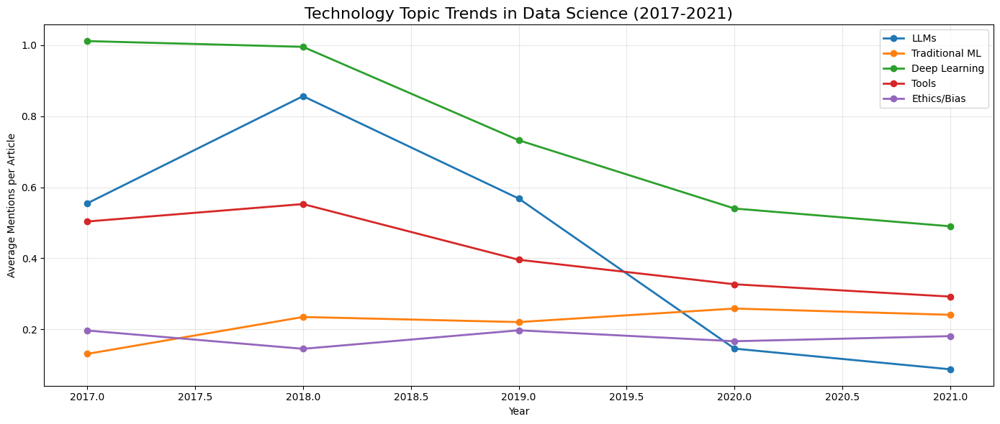

In [152]:
plt.figure(figsize=(14, 6))
for category in tech_keywords.keys():
    cat_data = trends_1721[trends_1721['Category'] == category]
    plt.plot(cat_data['Year'], cat_data['Mentions_per_Article'], 
             marker='o', label=category, linewidth=2)

plt.title('Technology Topic Trends in Data Science (2017-2021)', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Average Mentions per Article')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Observations:
* LLMs seemed to have been talked about (around 0.8) a lot in 2018 -> which is kind of suspicious - need to look into the keywords
* DL was talked about most in 2017 and 2018 and it has lowered in 2019->2020->2021. This could be because that in 2017 and 2018 there are a fewer number of articles compared to 2019-2021. Need to normalize by total article mentions. 
* Traditional ML slowly increased over time
* Mention of tools slowly reduced over the years
* Ethics/Bias mentions were comparatively real low

Calculating normalized values: total mentions across ALL categories per year

In [153]:
yearly_totals = trends_1721.groupby('Year')['Mentions'].sum().reset_index()
yearly_totals.columns = ['Year', 'Total_Mentions']
trends_1721 = trends_1721.merge(yearly_totals, on='Year')

Calculating the percentage of discourse

In [154]:
trends_1721['Share_of_Discourse'] = (trends_1721['Mentions'] / trends_1721['Total_Mentions']) * 100
trends_1721.head()

,Year,Category,Mentions,Articles,Mentions_per_Article,Total_Mentions,Share_of_Discourse
0,2021,LLMs,433,4921,0.087990,6363,6.804966
1,2020,LLMs,758,5188,0.146106,7466,10.152692
2,2019,LLMs,710,1250,0.568000,2643,26.863413
3,2018,LLMs,488,570,0.856140,1587,30.749842
4,2017,LLMs,152,274,0.554745,657,23.135464


Visualizing using the normalized 'Share of Discourse'

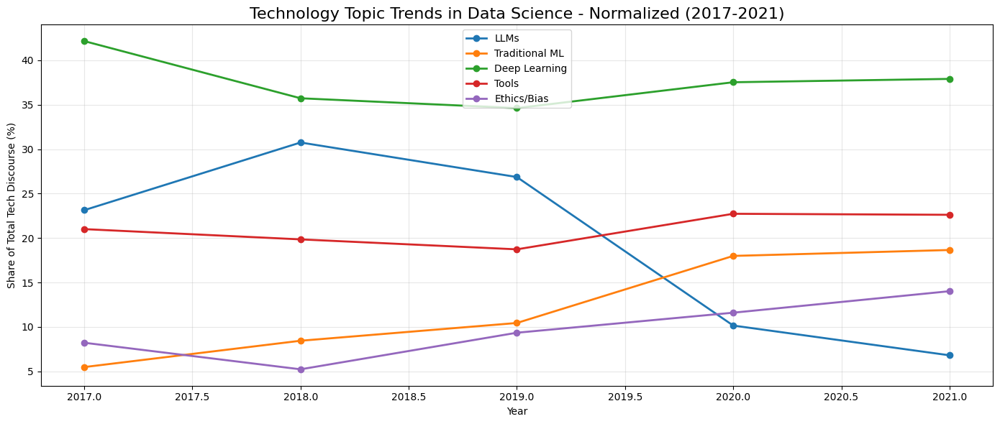

In [156]:
plt.figure(figsize=(14, 6))
for category in tech_keywords.keys():
    cat_data = trends_1721[trends_1721['Category'] == category]
    plt.plot(cat_data['Year'], cat_data['Share_of_Discourse'], 
             marker='o', label=category, linewidth=2)

plt.title('Technology Topic Trends in Data Science - Normalized (2017-2021)', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Share of Total Tech Discourse (%)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

* The spike in 2018 for LLMs seemed to be confirmed now. The cause could have been because of the introduction of GPT-1 in June of 2018 and BERT in October 2018, the small sample size (even though we've introduced normalization) could still have factored in. The keywords might also be catching on in early transfomer mentions.
* DL: From 2017-2019, DL dominated. From 2020-2021, DL seemed to have stabilized somewhat, which could hint they DL became foundational / standard method.
* Traditional ML: Seems to have a clear increase from 2017-2021. This could mean that people understood that not everything needed deep learning, and there could have been cost or complexity concerns.
* Ethics/Bias also shows a somewhat steady growth. This could mean that there were concerns regarding these in real-world deployment scenarios.
* Tools: Seem to be consistnet (somewhat). Regardless of trends, people need tools

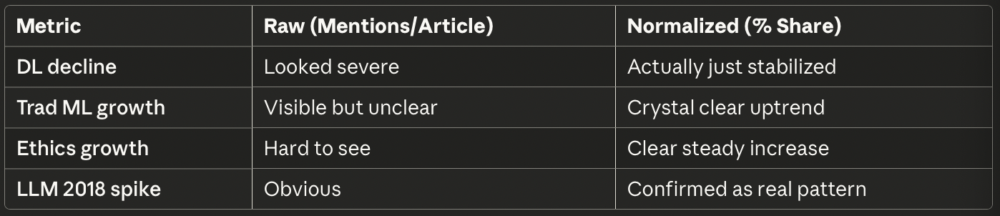

In [ ]:
# Checking the LLM articles again
year_2018 = df_1721[df_1721['Year'] == 2018]
llm_articles = year_2018[year_2018['full_text_cleaned'].str.contains('gpt|bert|transformer', case=False, na=False)]
print(f"Articles mentioning GPT/BERT/Transformer: {len(llm_articles)}")
print(llm_articles[['title']].head(10))

Articles mentioning GPT/BERT/Transformer: 151
                                                   title
11359           Top 30 data science interview questions.
11360  How to use machine learning for anomaly detect...
11361               Data Science for Algorithmic Trading
11363                          Extract features of Music
11366                  K-means Clustering Python Example
11378                    Weekly Selection — Dec 21, 2018
11385            Detecting bad customer reviews with NLP
11387                    Tutorial: Build a lane detector
11410  Data Science Curriculum from Scratch 2018 (Par...
11411            Simpson’s Paradox and Interpreting Data


Notable Observations on comparing 2017-2021 and 2022-2025
* 2022-2025 showed a higher mention of LLMs, 2017-2021 had a short period in 2018 where LLMs were mentioned more

### 7. BERTopic: 2017-2021
* So that BERTopic automatically finds topics on its own

In [1]:
from bertopic import BERTopic

/Users/aiswaryasuresh/miniforge3/envs/bertopic_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [3]:
import pandas as pd
content = pd.read_csv('combinedyears_content.csv')
content.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,content,Year
0,NaN,SQL Concepts that Beginners Have Trouble With,Julia Kho,https://medium.com/data-science/sql-concepts-t...,NaN,NaN,7,NaN,SQL Concepts that Beginners Have Trouble With ...,2022
1,NaN,Implementing Word2vec in PyTorch from the Grou...,Jonah Breslow,https://medium.com/data-science/implementing-w...,NaN,NaN,22,NaN,Implementing Word2vec in PyTorch from the Grou...,2022
2,NaN,Reinforcement Learning for Inventory Optimizat...,Guangrui Xie,https://medium.com/data-science/reinforcement-...,NaN,NaN,20,NaN,Reinforcement Learning for Inventory Optimizat...,2022
3,NaN,Torch and Torchvision C++ installation and deb...,Alexey Kravets,https://medium.com/data-science/torch-and-torc...,NaN,NaN,8,NaN,Torch and Torchvision C++ installation and deb...,2022
4,NaN,What Is Better: One General Model or Many Spec...,Samuele Mazzanti,https://medium.com/data-science/what-is-better...,NaN,NaN,10,NaN,What Is Better: One General Model or Many Spec...,2022


In [4]:
# Importing data from 2017-2021
df_1721 = pd.read_csv('df_content_2017_2021.csv')
df_1721.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status,content_cleaned,full_text_cleaned
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success,"in this article, i ll walk through how to buil...",feature engineering modeling in python in this...
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success,"after preparing for a long time, i recently to...",getting tensorflow developer certified after p...
2,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success,real life data is usually messy. it requires a...,a better way for data preprocessing pandas pip...
3,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success,it s easy to mess with sql without proper guid...,best practices to write readable and maintaina...
4,2021-07-31,Solve Sudoku using Linear Programming (Python ...,Lakshmi Ajay,https://towardsdatascience.com/solve-sudoku-us...,111,1,5,0,4.718499,solve sudoku using linear programming python pulp,\n### Exploiting the concepts of linear progra...,5933,success,exploiting the concepts of linear programming ...,solve sudoku using linear programming python p...


Converting the field where we have the cleaned content into a list, which is the format mostly expected for BERTopic

In [5]:
docs_1721 = df_1721['full_text_cleaned'].fillna('').tolist()

Cleaning and creating the combined title+content field

In [6]:
def clean_text(text):
    if pd.isna(text) or text == 'None' or text == '':
        return ''
    text = str(text)
    # Remove HTML tags
    text = re.sub(r'<[^>]+>', '', text)
    # Remove URLs
    text = re.sub(r'http\S+|www\S+', '', text)
    # Remove non-breaking spaces and special whitespace
    text = text.replace('\xa0', ' ')
    text = text.replace('\n', ' ')
    text = text.replace('\t', ' ')
    # Remove special characters but keep alphanumeric and spaces
    text = re.sub(r'[^a-zA-Z0-9\s]', ' ', text)
    # Remove extra whitespace
    text = ' '.join(text.split())
    # converting to lowecase
    text = text.lower()
    
    return text

In [8]:
import re
content['cleaned_title'] = content['title'].apply(clean_text)
content['cleaned_content'] = content['content'].apply(clean_text)

In [9]:
# Combining cleaned title + cleaned content into one column
content['cleaned_full_text'] = (content['cleaned_title']+ ' ' + content['cleaned_content'])
content.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,content,Year,cleaned_title,cleaned_content,cleaned_full_text
0,NaN,SQL Concepts that Beginners Have Trouble With,Julia Kho,https://medium.com/data-science/sql-concepts-t...,NaN,NaN,7,NaN,SQL Concepts that Beginners Have Trouble With ...,2022,sql concepts that beginners have trouble with,sql concepts that beginners have trouble with ...,sql concepts that beginners have trouble with ...
1,NaN,Implementing Word2vec in PyTorch from the Grou...,Jonah Breslow,https://medium.com/data-science/implementing-w...,NaN,NaN,22,NaN,Implementing Word2vec in PyTorch from the Grou...,2022,implementing word2vec in pytorch from the grou...,implementing word2vec in pytorch from the grou...,implementing word2vec in pytorch from the grou...
2,NaN,Reinforcement Learning for Inventory Optimizat...,Guangrui Xie,https://medium.com/data-science/reinforcement-...,NaN,NaN,20,NaN,Reinforcement Learning for Inventory Optimizat...,2022,reinforcement learning for inventory optimizat...,reinforcement learning for inventory optimizat...,reinforcement learning for inventory optimizat...
3,NaN,Torch and Torchvision C++ installation and deb...,Alexey Kravets,https://medium.com/data-science/torch-and-torc...,NaN,NaN,8,NaN,Torch and Torchvision C++ installation and deb...,2022,torch and torchvision c installation and debug...,torch and torchvision c installation and debug...,torch and torchvision c installation and debug...
4,NaN,What Is Better: One General Model or Many Spec...,Samuele Mazzanti,https://medium.com/data-science/what-is-better...,NaN,NaN,10,NaN,What Is Better: One General Model or Many Spec...,2022,what is better one general model or many speci...,what is better one general model or many speci...,what is better one general model or many speci...


In [10]:
# Filtering valid articles (title and content should be a minimum length)
content = content[
    (content['cleaned_title'].str.len() > 5) & 
    (content['cleaned_content'].str.len() > 100)
]
content.shape

(6150, 13)

In [11]:
content.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,content,Year,cleaned_title,cleaned_content,cleaned_full_text
0,NaN,SQL Concepts that Beginners Have Trouble With,Julia Kho,https://medium.com/data-science/sql-concepts-t...,NaN,NaN,7,NaN,SQL Concepts that Beginners Have Trouble With ...,2022,sql concepts that beginners have trouble with,sql concepts that beginners have trouble with ...,sql concepts that beginners have trouble with ...
1,NaN,Implementing Word2vec in PyTorch from the Grou...,Jonah Breslow,https://medium.com/data-science/implementing-w...,NaN,NaN,22,NaN,Implementing Word2vec in PyTorch from the Grou...,2022,implementing word2vec in pytorch from the grou...,implementing word2vec in pytorch from the grou...,implementing word2vec in pytorch from the grou...
2,NaN,Reinforcement Learning for Inventory Optimizat...,Guangrui Xie,https://medium.com/data-science/reinforcement-...,NaN,NaN,20,NaN,Reinforcement Learning for Inventory Optimizat...,2022,reinforcement learning for inventory optimizat...,reinforcement learning for inventory optimizat...,reinforcement learning for inventory optimizat...
3,NaN,Torch and Torchvision C++ installation and deb...,Alexey Kravets,https://medium.com/data-science/torch-and-torc...,NaN,NaN,8,NaN,Torch and Torchvision C++ installation and deb...,2022,torch and torchvision c installation and debug...,torch and torchvision c installation and debug...,torch and torchvision c installation and debug...
4,NaN,What Is Better: One General Model or Many Spec...,Samuele Mazzanti,https://medium.com/data-science/what-is-better...,NaN,NaN,10,NaN,What Is Better: One General Model or Many Spec...,2022,what is better one general model or many speci...,what is better one general model or many speci...,what is better one general model or many speci...


In [12]:
docs_2225 = content['cleaned_full_text'].fillna('').tolist()

In [13]:
df_1721['publish_date'] = pd.to_datetime(df_1721['publish_date'])
df_1721['Year'] = df_1721['publish_date'].dt.year
df_1721.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status,content_cleaned,full_text_cleaned,Year
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132,0,6,0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086,success,"in this article, i ll walk through how to buil...",feature engineering modeling in python in this...,2021
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17,0,6,1,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754,success,"after preparing for a long time, i recently to...",getting tensorflow developer certified after p...,2021
2,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596,10,4,1,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551,success,real life data is usually messy. it requires a...,a better way for data preprocessing pandas pip...,2021
3,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90,3,8,1,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278,success,it s easy to mess with sql without proper guid...,best practices to write readable and maintaina...,2021
4,2021-07-31,Solve Sudoku using Linear Programming (Python ...,Lakshmi Ajay,https://towardsdatascience.com/solve-sudoku-us...,111,1,5,0,4.718499,solve sudoku using linear programming python pulp,\n### Exploiting the concepts of linear progra...,5933,success,exploiting the concepts of linear programming ...,solve sudoku using linear programming python p...,2021


In [14]:
timestamps_1721 = df_1721['Year'].tolist()

In [15]:
timestamps_2225 = content['Year'].tolist()

#### Training BERTopic for 2017-2021 data

* Using CountVectorizer (bag of words vectorizer) to convert the text to token counts

In [16]:
vectorizer_1721 = CountVectorizer(
    stop_words='english', ngram_range=(1,2), min_df = 5 
)

* remove common english stop words, extract unigrams and bigrams
* `min_df=5` ignores tokens that appear in fewer than 5 documents (to reduce noise)

In [17]:
topic_model_1721 = BERTopic(
    vectorizer_model=vectorizer_1721, min_topic_size=20, 
    nr_topics = 'auto', calculate_probabilities=False, 
    verbose = True
)

* `min_topic_size=20` means no topic has fewer than 20 documents
* `nr_topics = 'auto'`. means let BERTopic merge topics automatically 
* `calculate_probabilities=False` means we're disabling probability estimation (since probabilities are slower to compute)

In [18]:
topics_1721, _ = topic_model_1721.fit_transform(docs_1721)

2025-11-12 23:57:19,957 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 382/382 [01:04<00:00,  5.91it/s]
2025-11-12 23:58:32,193 - BERTopic - Embedding - Completed ✓
2025-11-12 23:58:32,194 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-11-12 23:58:40,587 - BERTopic - Dimensionality - Completed ✓
2025-11-12 23:58:40,588 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-11-12 23:58:40,747 - BERTopic - Cluster - Completed ✓
2025-11-12 23:58:40,747 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-11-12 23:58:49,702 - BERTopic - Representation - Completed ✓
2025-11-12 23:58:49,704 - BERTopic - Topic reduction - Reducing number of topics
2025-11-12 23:58:49,715 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-12 23:58:58,642 - BERTopic - Representation - Completed ✓
2025-11-12 23:58:58,646 - BERTopic - Topic reduction - Re

* Training the BERTopic model on docs_1721 and return `topics_1721` as a lit of assigned topic IDs (one per document)
* The unused variable `_` holds topic probabilities or embeddings based on the BERTopic version

In [19]:
print(f"Topics discovered in 2017-2021: {len(set(topics_1721)) - 1}")
# -1 is done so that the topic with the outlier/noise topics is ignored

Topics discovered in 2017-2021: 61


In [20]:
topic_info_1721 = topic_model_1721.get_topic_info()
print("\nTop 10 Topics (2017-2021):")
print(topic_info_1721.head(11)[['Topic', 'Count', 'Name']])


Top 10 Topics (2017-2021):
    Topic  Count                                               Name
0      -1   3467                         -1_data_model_learning_use
1       0   3285               0_data_science_data science_learning
2       1    470       1_distribution_probability_sample_hypothesis
3       2    463                             2_word_words_text_bert
4       3    342                       3_python_list_function_class
5       4    334                   4_plot_plots_visualization_chart
6       5    267                        5_state_action_policy_agent
7       6    220                  6_pandas_dataframe_column_columns
8       7    218  7_ai_intelligence_artificial_artificial intell...
9       8    167                   8_app_streamlit_jupyter_notebook
10      9    149                       9_team_player_players_season


* The topics could be: Data Science in Business, Python, Visualization, Pandas, BERT (words, text), Reinforcement Learning (State, action, policy, agent), Probability, AI, Jupyter, Streamlit

#### Training BERTopic for 2022-2025 data

In [21]:
vectorizer_2225 = CountVectorizer(
    stop_words="english",
    ngram_range=(1, 2),
    min_df=10  
)

In [22]:
topic_model_2225 = BERTopic(
    vectorizer_model=vectorizer_2225,
    min_topic_size=30,  # Adjust based on your dataset size
    nr_topics="auto",
    calculate_probabilities=False,
    verbose=True
)
topics_2225, _ = topic_model_2225.fit_transform(docs_2225)


2025-11-12 23:59:02,021 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 193/193 [00:32<00:00,  5.94it/s]
2025-11-12 23:59:40,676 - BERTopic - Embedding - Completed ✓
2025-11-12 23:59:40,677 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-11-12 23:59:41,910 - BERTopic - Dimensionality - Completed ✓
2025-11-12 23:59:41,910 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-11-12 23:59:41,985 - BERTopic - Cluster - Completed ✓
2025-11-12 23:59:41,985 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2025-11-12 23:59:45,639 - BERTopic - Representation - Completed ✓
2025-11-12 23:59:45,640 - BERTopic - Topic reduction - Reducing number of topics
2025-11-12 23:59:45,646 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-12 23:59:49,024 - BERTopic - Representation - Completed ✓
2025-11-12 23:59:49,026 - BERTopic - Topic reduction - Re

In [23]:
print(f"Topics discovered in 2022-2025: {len(set(topics_2225)) - 1}")
topic_info_2225 = topic_model_2225.get_topic_info()

Topics discovered in 2022-2025: 20


In [24]:
print(topic_info_2225.head(11)[['Topic', 'Count', 'Name']])

    Topic  Count                                         Name
0      -1   1171                     -1_data_model_models_use
1       0   2873                       0_data_model_ai_models
2       1    495                         1_data_chart_3d_plot
3       2    263                   2_treatment_causal_df_test
4       3    146                     3_trees_false_tree_train
5       4    142          4_data_clustering_outliers_features
6       5    140                   5_python_array_arrays_code
7       6    138        6_time series_series_time_forecasting
8       7    132                 7_policy_reward_state_action
9       8     94       8_probability_mean_sample_distribution
10      9     80  9_optimization_problem_solution_programming


* Topics could be: AI Models/ Data Modeling, 3d plots/visualization, Python, Time Series, Data Clustering, Outliers, Tree models, Reinforcement Learning, Causal inference / Treatment effect estimation, Optimization problems, Probability
* Topic 0 (the largest model) suggests a broad interest in AI model architectures and data modeling, typical of modern discussions (LLMs, MLOps, etc.).

#### 2017-2021 vs 2022-2025
* 2017-2021: More introductory - Data Science, Pandas, Visualization, AI basics. 
* 2022 - 2025: More technical/mature - Optimization, Graphs, Causal Inference, Reinforcement Learning. Reflects trend toward research-oriented and advanced ML
* Reinforcement Learning (Topic) persisted across both time periods which shows sustained relevance
* The drop in pandas/dataframe-type beginner topics implies that community focus shifted from learning tools to applying and extending ML.
* Thus, a progression from basic programming and data handling, to advanced ML, optimization and causal learning

#### Visualizing each period

In [25]:
topics_over_time_1721 = topic_model_1721.topics_over_time(
    docs_1721,
    timestamps_1721,
    nr_bins=len(df_1721['Year'].unique())
)


5it [00:20,  4.15s/it]


In [34]:
import plotly.io as pio
pio.renderers.default = 'notebook'

fig1 = topic_model_1721.visualize_topics_over_time(
    topics_over_time_1721,
    top_n_topics=10,
    width=1000,
    height=500
)
fig1.show()

In [37]:
fig2 = topic_model_1721.visualize_topics(width=1000, height=800)
fig2.show()

In [38]:
fig3 = topic_model_1721.visualize_barchart(top_n_topics=15, width=800, height=600)
fig3.show()

In [39]:
topic_info_1721.to_csv('topics_2017_2021.csv', index=False)
topic_info_2225.to_csv('topics_2022_2025.csv', index=False)


#### Comparing Topics between Periods

In [40]:
def get_topic_embeddings(topic_model):
    """Extract topic representations as vectors"""
    topic_embeddings = {}
    all_topics = [t for t in topic_model.get_topics().keys() if t != -1]
    
    for topic_id in all_topics:
        topic_words = topic_model.get_topic(topic_id)
        if topic_words:
            # Use top words as representation
            words = [word for word, _ in topic_words[:10]]
            topic_embeddings[topic_id] = ' '.join(words)
    
    return topic_embeddings

early_embeddings = get_topic_embeddings(topic_model_1721)
late_embeddings = get_topic_embeddings(topic_model_2225)


In [41]:
# Find similar topics across periods using simple text matching
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

early_topics_list = list(early_embeddings.keys())
late_topics_list = list(late_embeddings.keys())

early_reps = [early_embeddings[t] for t in early_topics_list]
late_reps = [late_embeddings[t] for t in late_topics_list]

In [42]:
if early_reps and late_reps:
    vectorizer = TfidfVectorizer()
    all_reps = early_reps + late_reps
    tfidf_matrix = vectorizer.fit_transform(all_reps)
    
    early_matrix = tfidf_matrix[:len(early_reps)]
    late_matrix = tfidf_matrix[len(early_reps):]
    
    similarity_matrix = cosine_similarity(early_matrix, late_matrix)


In [44]:
mappings = []
for i, early_id in enumerate(early_topics_list):
    max_sim_idx = similarity_matrix[i].argmax()
    max_sim = similarity_matrix[i][max_sim_idx]
        
    if max_sim > 0.3:  # Threshold for considering a match
        late_id = late_topics_list[max_sim_idx]
        early_name = topic_model_1721.get_topic_info(early_id)['Name'].values[0]
        late_name = topic_model_2225.get_topic_info(late_id)['Name'].values[0]
            
        mappings.append({
            'Early_Topic_ID': early_id,
            'Early_Topic_Name': early_name,
            'Late_Topic_ID': late_id,
            'Late_Topic_Name': late_name,
            'Similarity': max_sim
        })
            
        print(f"2017-2021: {early_name[:40]:40s} <-> 2022-2025: {late_name[:40]:40s} ({max_sim:.2f})")
    
# Save mappings
pd.DataFrame(mappings).to_csv('topic_mappings.csv', index=False)
print("\n✓ Saved: topic_mappings.csv")

2017-2021: 1_distribution_probability_sample_hypoth <-> 2022-2025: 8_probability_mean_sample_distribution   (0.47)
2017-2021: 2_word_words_text_bert                   <-> 2022-2025: 15_topic_topics_semantic_model           (0.32)
2017-2021: 4_plot_plots_visualization_chart         <-> 2022-2025: 1_data_chart_3d_plot                     (0.42)
2017-2021: 5_state_action_policy_agent              <-> 2022-2025: 7_policy_reward_state_action             (0.58)
2017-2021: 10_table_sql_database_tables             <-> 2022-2025: 11_sql_data_table_functions              (0.38)
2017-2021: 16_clusters_clustering_cluster_distance  <-> 2022-2025: 4_data_clustering_outliers_features      (0.58)
2017-2021: 20_graph_nodes_node_graphs               <-> 2022-2025: 10_graph_node_nodes_network              (0.67)
2017-2021: 25_tree_decision_trees_decision tree     <-> 2022-2025: 3_trees_false_tree_train                 (0.44)
2017-2021: 27_anomaly_outliers_outlier_detection    <-> 2022-2025: 4_data_cluste

* Above are the topics that are similar across both the periods

#### Unique Topics per period

In [45]:
matched_late_ids = [m['Late_Topic_ID'] for m in mappings if m['Similarity'] > 0.4]
unmatched_late = [t for t in late_topics_list if t not in matched_late_ids]


##### Top 10 unique topics in 2022-2025

In [46]:
for topic_id in unmatched_late[:10]:  # Show top 10
    topic_name = topic_model_2225.get_topic_info(topic_id)['Name'].values[0]
    topic_count = topic_model_2225.get_topic_info(topic_id)['Count'].values[0]
    print(f"  Topic {topic_id:3d}: {topic_name[:60]:60s} ({topic_count} articles)")


  Topic   0: 0_data_model_ai_models                                       (2873 articles)
  Topic   2: 2_treatment_causal_df_test                                   (263 articles)
  Topic   5: 5_python_array_arrays_code                                   (140 articles)
  Topic   6: 6_time series_series_time_forecasting                        (138 articles)
  Topic  11: 11_sql_data_table_functions                                  (69 articles)
  Topic  12: 12_magic_python_notebook_module                              (63 articles)
  Topic  13: 13_pandas_dataframe_pd_df                                    (61 articles)
  Topic  14: 14_graph_node_article_knowledge                              (46 articles)
  Topic  15: 15_topic_topics_semantic_model                               (35 articles)
  Topic  16: 16_table_power_date_sales                                    (34 articles)


##### Top 10 unique topics in 2017-2021

In [47]:
matched_early_ids = [m['Early_Topic_ID'] for m in mappings if m['Similarity'] > 0.4]
unmatched_early = [t for t in early_topics_list if t not in matched_early_ids]

for topic_id in unmatched_early[:10]:  # Show top 10
    topic_name = topic_model_1721.get_topic_info(topic_id)['Name'].values[0]
    topic_count = topic_model_1721.get_topic_info(topic_id)['Count'].values[0]
    print(f"  Topic {topic_id:3d}: {topic_name[:60]:60s} ({topic_count} articles)")


  Topic   0: 0_data_science_data science_learning                         (3285 articles)
  Topic   2: 2_word_words_text_bert                                       (463 articles)
  Topic   3: 3_python_list_function_class                                 (342 articles)
  Topic   6: 6_pandas_dataframe_column_columns                            (220 articles)
  Topic   7: 7_ai_intelligence_artificial_artificial intelligence         (218 articles)
  Topic   8: 8_app_streamlit_jupyter_notebook                             (167 articles)
  Topic   9: 9_team_player_players_season                                 (149 articles)
  Topic  10: 10_table_sql_database_tables                                 (129 articles)
  Topic  11: 11_customer_churn_customers_features                         (120 articles)
  Topic  12: 12_regression_linear_linear regression_model                 (119 articles)


#### Comparison Visualization

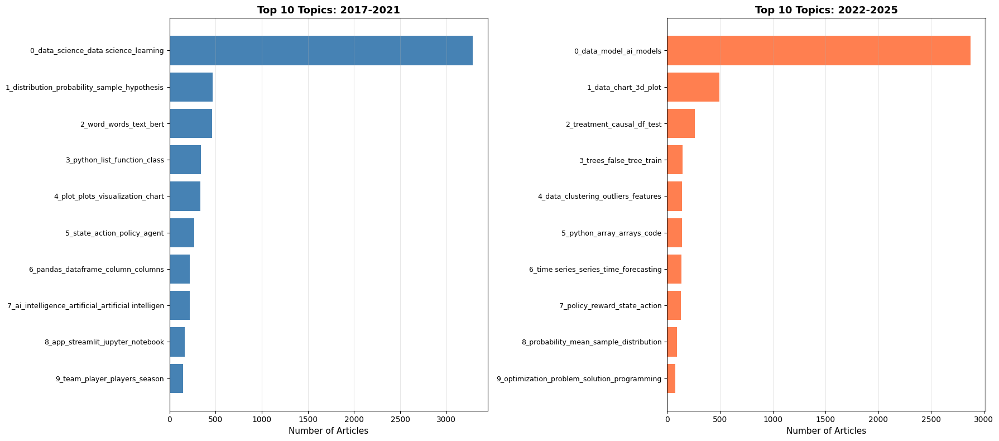

In [52]:
import matplotlib.pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

top_early = topic_info_1721[topic_info_1721['Topic'] != -1].head(10)
ax1.barh(range(len(top_early)), top_early['Count'], color='steelblue')
ax1.set_yticks(range(len(top_early)))
ax1.set_yticklabels([name[:50] for name in top_early['Name']], fontsize=9)
ax1.set_xlabel('Number of Articles', fontsize=11)
ax1.set_title('Top 10 Topics: 2017-2021', fontsize=13, fontweight='bold')
ax1.invert_yaxis()
ax1.grid(axis='x', alpha=0.3)

top_late = topic_info_2225[topic_info_2225['Topic'] != -1].head(10)
ax2.barh(range(len(top_late)), top_late['Count'], color='coral')
ax2.set_yticks(range(len(top_late)))
ax2.set_yticklabels([name[:50] for name in top_late['Name']], fontsize=9)
ax2.set_xlabel('Number of Articles', fontsize=11)
ax2.set_title('Top 10 Topics: 2022-2025', fontsize=13, fontweight='bold')
ax2.invert_yaxis()
ax2.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig('period_comparison_topics.png', dpi=300, bbox_inches='tight')
plt.show()

##### Exporting the dataset with the topics

In [60]:
content_2017_2021_annotated = df_1721.copy()
content_2017_2021_annotated['Topic_ID'] = topics_1721
content_2017_2021_annotated['Topic_Name'] = [
    topic_model_1721.get_topic_info(t)['Name'].values[0] if t != -1 else 'Outlier'
    for t in topics_1721
]

content_2022_2025_annotated = content.copy()
content_2022_2025_annotated['Topic_ID'] = topics_2225
content_2022_2025_annotated['Topic_Name'] = [
    topic_model_2225.get_topic_info(t)['Name'].values[0] if t != -1 else 'Outlier'
    for t in topics_2225
]

content_2017_2021_annotated.to_csv('articles_2017_2021_with_topics.csv', index=False)
content_2022_2025_annotated.to_csv('articles_2022_2025_with_topics.csv', index=False)

print("\n✓ Saved: articles_2017_2021_with_topics.csv")
print("✓ Saved: articles_2022_2025_with_topics.csv")


✓ Saved: articles_2017_2021_with_topics.csv
✓ Saved: articles_2022_2025_with_topics.csv


## 8. Author Classification
* Classifying authors based on their publishing behavior as: Late Bloomer (2.5x more articles in 2022-2025 than in 2017-2021), Early Pioneer(2.5x more articles in 2017-2021 than 2022+), Bridge Builder ( Balanced activity across both period), Early Era Only (Only published 2017-2021), New voice (only published 2022-2025)

In [64]:
# Combining the datasets from both periods into one
all_articles = pd.concat([df_1721, content], ignore_index=True)
all_articles.head()

,publish_date,title,author,url,claps,responses,reading_time,paid,log_claps,title_cleaned,content,content_length,scrape_status,content_cleaned,full_text_cleaned,Year,cleaned_title,cleaned_content,cleaned_full_text
0,2021-07-31,Feature Engineering & Modeling in Python,Jessie Xu,https://towardsdatascience.com/titanic-feature...,132.0,0.0,6,0.0,4.890349,feature engineering modeling in python,"In this article, I’ll walk through how to buil...",5086.0,success,"in this article, i ll walk through how to buil...",feature engineering modeling in python in this...,2021,NaN,NaN,NaN
1,2021-07-31,Getting TensorFlow Developer certified,Pascal Janetzky,https://towardsdatascience.com/getting-tensorf...,17.0,0.0,6,1.0,2.890372,getting tensorflow developer certified,"After preparing for a long time, I recently to...",9754.0,success,"after preparing for a long time, i recently to...",getting tensorflow developer certified after p...,2021,NaN,NaN,NaN
2,2021-07-31,A Better Way for Data Preprocessing: Pandas Pipe,Soner Yıldırım,https://towardsdatascience.com/a-better-way-fo...,596.0,10.0,4,1.0,6.391917,a better way for data preprocessing pandas pipe,Real-life data is usually messy. It requires a...,3551.0,success,real life data is usually messy. it requires a...,a better way for data preprocessing pandas pip...,2021,NaN,NaN,NaN
3,2021-07-31,10 Best Practices to Write Readable and Mainta...,David Martins,https://towardsdatascience.com/10-best-practic...,90.0,3.0,8,1.0,4.510860,best practices to write readable and maintaina...,It’s easy to mess with SQL without proper guid...,7278.0,success,it s easy to mess with sql without proper guid...,best practices to write readable and maintaina...,2021,NaN,NaN,NaN
4,2021-07-31,Solve Sudoku using Linear Programming (Python ...,Lakshmi Ajay,https://towardsdatascience.com/solve-sudoku-us...,111.0,1.0,5,0.0,4.718499,solve sudoku using linear programming python pulp,\n### Exploiting the concepts of linear progra...,5933.0,success,exploiting the concepts of linear programming ...,solve sudoku using linear programming python p...,2021,NaN,NaN,NaN


In [65]:
# Clean author names
all_articles['author'] = all_articles['author'].fillna('Unknown').str.strip()
all_articles = all_articles[all_articles['author'] != 'Unknown']
all_articles = all_articles[all_articles['author'] != '']

In [66]:
print(f"\nTotal articles: {len(all_articles)}")
print(f"Unique authors: {all_articles['author'].nunique()}")
print(f"Year range: {all_articles['Year'].min()} - {all_articles['Year'].max()}")


Total articles: 18353
Unique authors: 4733
Year range: 2017 - 2025


Calculating Author Metrics

In [67]:
# Count articles per author
author_stats = all_articles.groupby('author').agg({
    'Year': ['min', 'max', 'count', 'nunique']
}).reset_index()

author_stats.columns = ['author', 'first_year', 'last_year', 'total_articles', 'years_active']
author_stats['year_span'] = author_stats['last_year'] - author_stats['first_year']

In [68]:
# Articles in each period
early_period_counts = all_articles[all_articles['Year'] <= 2021].groupby('author').size()
late_period_counts = all_articles[all_articles['Year'] >= 2022].groupby('author').size()

author_stats['early_period_articles'] = author_stats['author'].map(early_period_counts).fillna(0).astype(int)
author_stats['late_period_articles'] = author_stats['author'].map(late_period_counts).fillna(0).astype(int)


Finding significant authors (atleast 5 articles)

In [69]:
significant_authors = author_stats[author_stats['total_articles'] >= 5].copy()

print(f"\nAuthors with 5+ articles: {len(significant_authors)}")


Authors with 5+ articles: 786


Classifying the authors

In [70]:
def classify_author_type(row):
    early = row['early_period_articles']
    late = row['late_period_articles']
    
    if early > 0 and late > 0:
        ratio = late / early if early > 0 else float('inf')
        
        if ratio >= 2.5:
            return "Late Bloomer"
        elif ratio <= 0.4:
            return "Early Pioneer"
        else:
            return "Bridge Builder"
    elif early > 0:
        return "Early Era Only"
    else:
        return "New Voice"


In [71]:
significant_authors['author_type'] = significant_authors.apply(classify_author_type, axis=1)

# Display classification results
print("\nAuthor Classification Results:")
print(significant_authors['author_type'].value_counts().to_string())


Author Classification Results:
author_type
Early Era Only    389
New Voice         255
Bridge Builder     55
Early Pioneer      49
Late Bloomer       38


In [72]:
for author_type in significant_authors['author_type'].unique():
    type_data = significant_authors[significant_authors['author_type'] == author_type]
    
    print(f"\n{author_type}:")
    print(f"  Count: {len(type_data)} authors")
    print(f"  Avg articles: {type_data['total_articles'].mean():.1f}")
    print(f"  Avg years active: {type_data['years_active'].mean():.1f}")
    print(f"  Early period avg: {type_data['early_period_articles'].mean():.1f}")
    print(f"  Late period avg: {type_data['late_period_articles'].mean():.1f}")
    
    # Show top 3 examples
    print(f"  Top examples:")
    top_3 = type_data.nlargest(3, 'total_articles')
    for _, author in top_3.iterrows():
        print(f"    • {author['author'][:40]:40s} ({author['total_articles']} articles)")


New Voice:
  Count: 255 authors
  Avg articles: 12.5
  Avg years active: 2.1
  Early period avg: 0.0
  Late period avg: 12.5
  Top examples:
    • Egor Howell                              (115 articles)
    • Lee Vaughan                              (55 articles)
    • Cristian Leo                             (52 articles)

Early Era Only:
  Count: 389 authors
  Avg articles: 12.2
  Avg years active: 1.9
  Early period avg: 12.2
  Late period avg: 0.0
  Top examples:
    • Kurtis Pykes                             (137 articles)
    • Terence Shin                             (128 articles)
    • Sara A. Metwalli                         (99 articles)

Early Pioneer:
  Count: 49 authors
  Avg articles: 43.4
  Avg years active: 4.0
  Early period avg: 39.7
  Late period avg: 3.7
  Top examples:
    • TDS Editors                              (393 articles)
    • Soner Yıldırım                           (390 articles)
    • Dario Radečić                            (235 articles)

Bridge Bui

Visualizations

1. Author Type Distribution

In [73]:
# Set color palette
colors = {
    "Late Bloomer": "#FF6B6B",
    "Early Pioneer": "#4ECDC4",
    "Bridge Builder": "#95E1D3",
    "Early Era Only": "#FFA07A",
    "New Voice": "#DDA15E"
}

✓ Saved: author_classification_overview.png


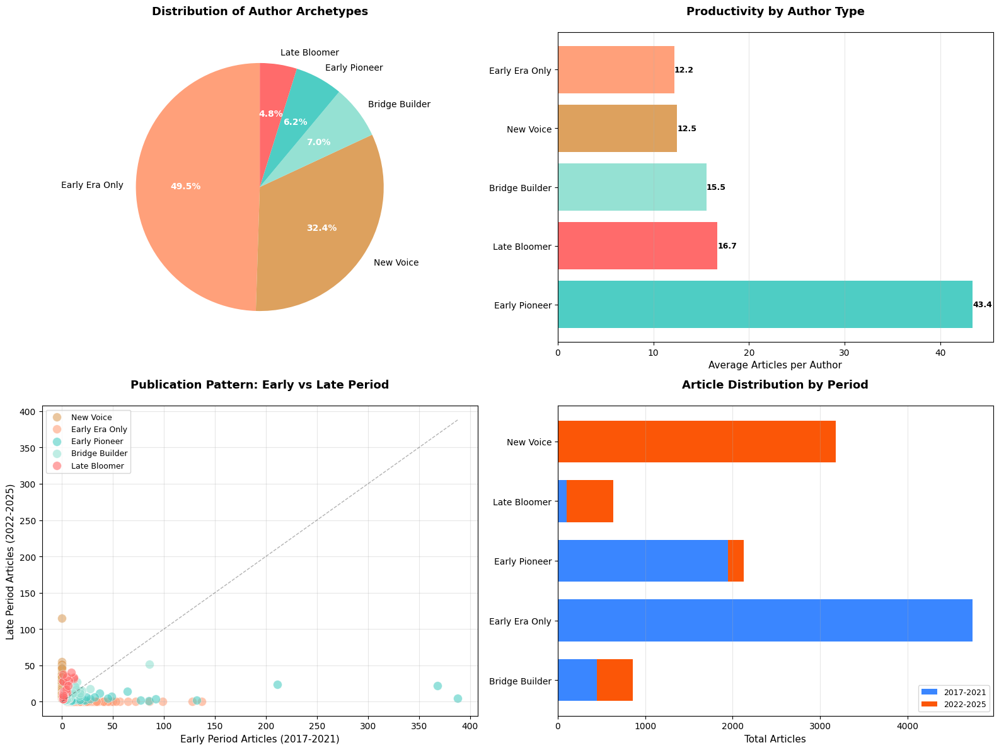

In [74]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Pie chart
type_counts = significant_authors['author_type'].value_counts()
ax1 = axes[0, 0]
wedges, texts, autotexts = ax1.pie(
    type_counts.values, 
    labels=type_counts.index,
    autopct='%1.1f%%',
    colors=[colors.get(t, '#CCCCCC') for t in type_counts.index],
    startangle=90,
    textprops={'fontsize': 10}
)
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')
ax1.set_title('Distribution of Author Archetypes', fontsize=13, fontweight='bold', pad=20)

# Bar chart: Average articles per type
ax2 = axes[0, 1]
avg_articles = significant_authors.groupby('author_type')['total_articles'].mean().sort_values(ascending=False)
bars = ax2.barh(range(len(avg_articles)), avg_articles.values, 
                color=[colors.get(t, '#CCCCCC') for t in avg_articles.index])
ax2.set_yticks(range(len(avg_articles)))
ax2.set_yticklabels(avg_articles.index, fontsize=10)
ax2.set_xlabel('Average Articles per Author', fontsize=11)
ax2.set_title('Productivity by Author Type', fontsize=13, fontweight='bold', pad=20)
ax2.grid(axis='x', alpha=0.3)

# Add value labels on bars
for i, bar in enumerate(bars):
    width = bar.get_width()
    ax2.text(width, bar.get_y() + bar.get_height()/2, f'{width:.1f}',
             ha='left', va='center', fontsize=9, fontweight='bold')

# Scatter plot: Early vs Late period articles
ax3 = axes[1, 0]
for author_type in significant_authors['author_type'].unique():
    type_data = significant_authors[significant_authors['author_type'] == author_type]
    ax3.scatter(type_data['early_period_articles'], 
               type_data['late_period_articles'],
               label=author_type,
               color=colors.get(author_type, '#CCCCCC'),
               alpha=0.6,
               s=100,
               edgecolors='white',
               linewidth=0.5)

ax3.plot([0, significant_authors['early_period_articles'].max()], 
         [0, significant_authors['early_period_articles'].max()], 
         'k--', alpha=0.3, linewidth=1)
ax3.set_xlabel('Early Period Articles (2017-2021)', fontsize=11)
ax3.set_ylabel('Late Period Articles (2022-2025)', fontsize=11)
ax3.set_title('Publication Pattern: Early vs Late Period', fontsize=13, fontweight='bold', pad=20)
ax3.legend(loc='upper left', fontsize=9)
ax3.grid(True, alpha=0.3)

# Stacked bar: Period distribution by author type
ax4 = axes[1, 1]
period_data = significant_authors.groupby('author_type')[['early_period_articles', 'late_period_articles']].sum()
period_data.plot(kind='barh', stacked=True, ax=ax4, 
                color=['#3A86FF', '#FB5607'], 
                width=0.7)
ax4.set_xlabel('Total Articles', fontsize=11)
ax4.set_ylabel('')
ax4.set_title('Article Distribution by Period', fontsize=13, fontweight='bold', pad=20)
ax4.legend(['2017-2021', '2022-2025'], loc='lower right', fontsize=9)
ax4.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig('author_classification_overview.png', dpi=300, bbox_inches='tight')
print("✓ Saved: author_classification_overview.png")
plt.show()


2. Top Authors by Type

✓ Saved: top_authors_by_type.png


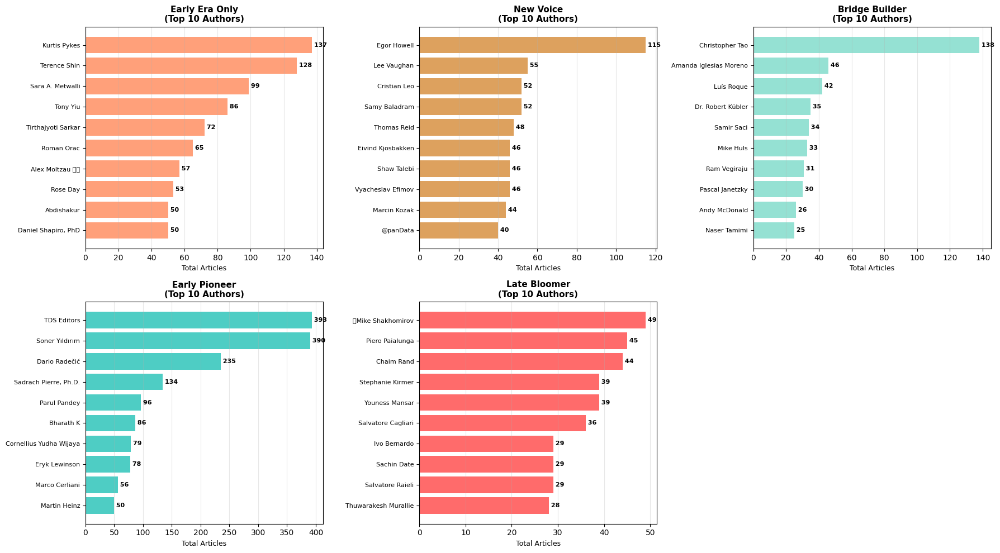

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, author_type in enumerate(significant_authors['author_type'].value_counts().index):
    if idx >= 6:
        break
    
    type_data = significant_authors[significant_authors['author_type'] == author_type]
    top_10 = type_data.nlargest(10, 'total_articles')
    
    ax = axes[idx]
    bars = ax.barh(range(len(top_10)), top_10['total_articles'].values,
                   color=colors.get(author_type, '#CCCCCC'))
    ax.set_yticks(range(len(top_10)))
    ax.set_yticklabels([name[:25] for name in top_10['author']], fontsize=8)
    ax.set_xlabel('Total Articles', fontsize=9)
    ax.set_title(f'{author_type}\n(Top 10 Authors)', fontsize=11, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(axis='x', alpha=0.3)
    
    # Add value labels
    for i, bar in enumerate(bars):
        width = bar.get_width()
        ax.text(width, bar.get_y() + bar.get_height()/2, f' {int(width)}',
                ha='left', va='center', fontsize=8, fontweight='bold')

# Hide extra subplots if less than 6 types
for idx in range(len(significant_authors['author_type'].unique()), 6):
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig('top_authors_by_type.png', dpi=300, bbox_inches='tight')
print("✓ Saved: top_authors_by_type.png")
plt.show()

3. Timeline View

✓ Saved: author_timeline_by_type.png


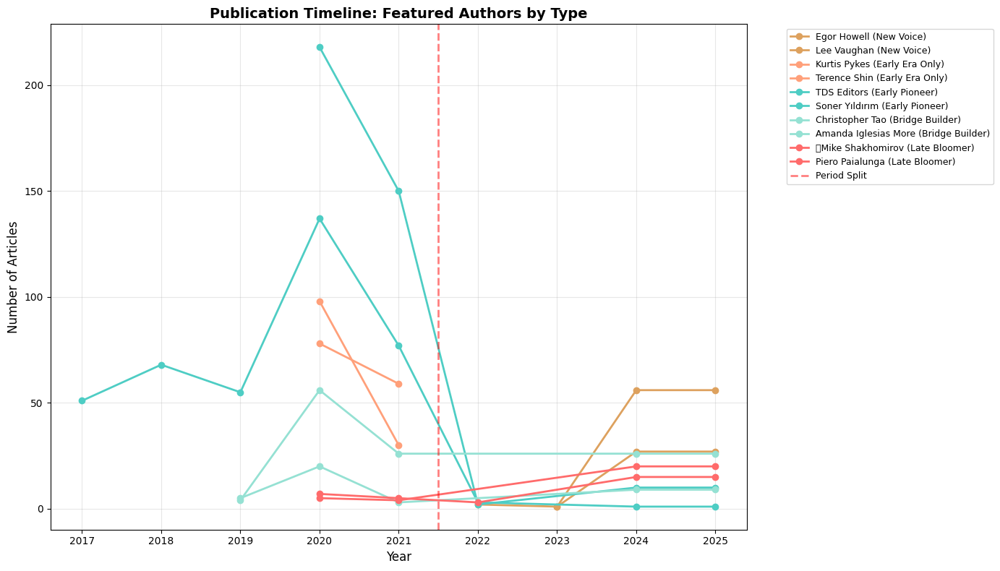

In [77]:
fig, ax = plt.subplots(figsize=(14, 8))

# Select top authors from each type (2 per type)
featured_authors = []
for author_type in significant_authors['author_type'].unique():
    type_authors = significant_authors[significant_authors['author_type'] == author_type].nlargest(2, 'total_articles')
    featured_authors.extend(type_authors['author'].tolist())

for author in featured_authors[:10]:  # Limit to 10 for readability
    author_data = all_articles[all_articles['author'] == author]
    yearly_counts = author_data.groupby('Year').size()
    author_type = significant_authors[significant_authors['author'] == author]['author_type'].values[0]
    
    ax.plot(yearly_counts.index, yearly_counts.values, 
            marker='o', label=f"{author[:20]} ({author_type})", 
            linewidth=2, markersize=6,
            color=colors.get(author_type, '#CCCCCC'))

ax.axvline(x=2021.5, color='red', linestyle='--', linewidth=2, alpha=0.5, label='Period Split')
ax.set_xlabel('Year', fontsize=12)
ax.set_ylabel('Number of Articles', fontsize=12)
ax.set_title('Publication Timeline: Featured Authors by Type', fontsize=14, fontweight='bold')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('author_timeline_by_type.png', dpi=300, bbox_inches='tight')
print("✓ Saved: author_timeline_by_type.png")
plt.show()

##### Exporting the data 
* For using in the streamlit app

In [78]:
significant_authors.to_csv('author_classification_results.csv', index=False)
print("Saved: author_classification_results.csv")


Saved: author_classification_results.csv


In [80]:
# Run this once to save your models:
topic_model_1721.save("bertopic_model_2017_2021")
topic_model_2225.save("bertopic_model_2022_2025")

2025-11-13 01:44:01,404 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.
2025-11-13 01:44:05,949 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


For streamlit: exporting the below dataset

In [81]:
tech_keywords = {
    'LLMs': ['llm', 'gpt', 'chatgpt', 'large language model', 'generative ai', 'openai'],
    'Traditional ML': ['linear regression', 'random forest', 'decision tree', 'xgboost', 'svm'],
    'Deep Learning': ['neural network', 'deep learning', 'cnn', 'rnn', 'lstm', 'transformer'],
    'Tools': ['pytorch', 'tensorflow', 'keras', 'scikit learn', 'hugging face'],
    'Ethics/Bias': ['bias', 'fairness', 'ethics', 'responsible ai', 'explainability']
}

def count_keywords(text, keyw):
    text = str(text).lower()
    return sum(1 for kw in keyw if kw in text)

# Combine both datasets
all_content = pd.concat([df_1721, content], ignore_index=True)

# Calculate mentions per category per year
results = []
for category, keywords in tech_keywords.items():
    for year in all_content['Year'].unique():
        year_data = all_content[all_content['Year'] == year]
        total_articles = len(year_data)
        mentions = year_data['content'].apply(
            lambda x: count_keywords(x, keywords)
        ).sum()
        results.append({
            'Year': year,
            'Category': category,
            'Mentions': mentions,
            'Articles': total_articles,
            'Mentions_per_Article': mentions/total_articles if total_articles > 0 else 0
        })

# Convert to DataFrame
df_results = pd.DataFrame(results)

# Calculate normalized metrics (Share of Discourse)
yearly_totals = df_results.groupby('Year')['Mentions'].sum().reset_index()
yearly_totals.columns = ['Year', 'Total_Mentions']
df_results = df_results.merge(yearly_totals, on='Year')
df_results['Share_of_Discourse'] = (df_results['Mentions'] / df_results['Total_Mentions']) * 100

# Save
df_results.to_csv('topic_trends_normalized.csv', index=False)
print(f"   ✓ Saved: topic_trends_normalized.csv ({len(df_results)} rows)")

   ✓ Saved: topic_trends_normalized.csv (45 rows)
